# Machine learning Notes


## Classification

### Logistic Regression

**Context**

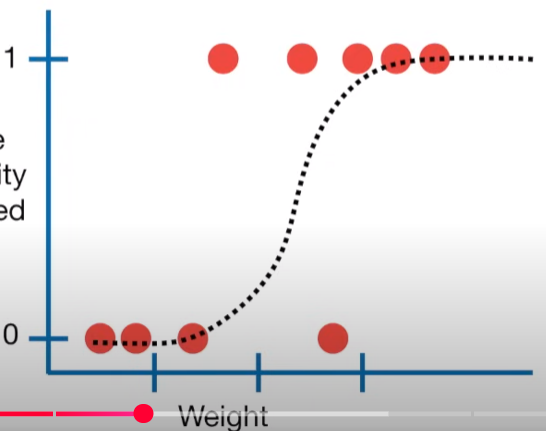
- Logistic regression is similar to linear regression, except logistic regression predicts whether something is `True` or `False`, instead of predicting something continuous like size
- instead of fitting a line to the data, logistic regression fits and "S" shaped "logistic function"
- the curved tells you the probability that a mouse is obese based on its weight
- if we weight a very heavy mouse, there is a high probability that the new mouse is obese
- Although, logistic regression tells the probability, but it usually used for classification. Eg: if a probability of a mouse is obese is > 50%, then we classify it as "obese", otherwise "not obese"
- Similar to linear regression, we can have **obesity** predicted by **Weight + Genotype + etc**

&nbsp;

**The difference between fitting the linear regression and logistic regression**
- Linear regression : 
    - we fit the line using "least squares" (ie: we find the line that minimizes the sum of the squares of there residuals)
    - we also use the residuals to calculate $R^2$ and to compare simple models to complicated models
- Logistic regression : (doesnt have the concept of residuals)
    - it fit the line using "Maximum Likelihood" 

    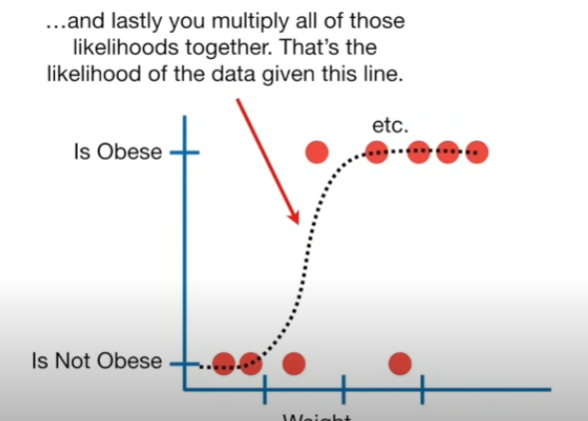
    - ie: you pick a probability, scaled by weight, of observing an obese mouse, just like the curve, and use that to calculate the likelihood of observing all the mice. Lastly you multiply all of those likelihoods together. That's the likelihood of the data given this line. Then shift the line and calculate a new likelihood of the data, and shift and calculate again... Finally the curve with the maximum likelihood is selected.

&nbsp;

**Dives into details**

Context
- Logistic Regression is a specific type of Generalized Linear Model(GLM)
- Generalized Linear Models are a generalization of the concepts and abilities of regular Linear Models 

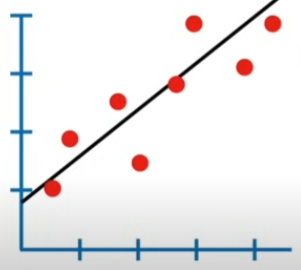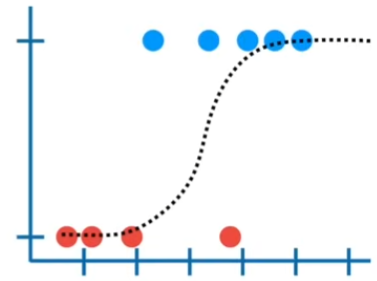
- On the left side is linear regression, on the right side is logistic regression 
- With linear regression, the values on the y-axis can be any number; With logistic regression, the y-axis is confined to probability values between 0 and 1.

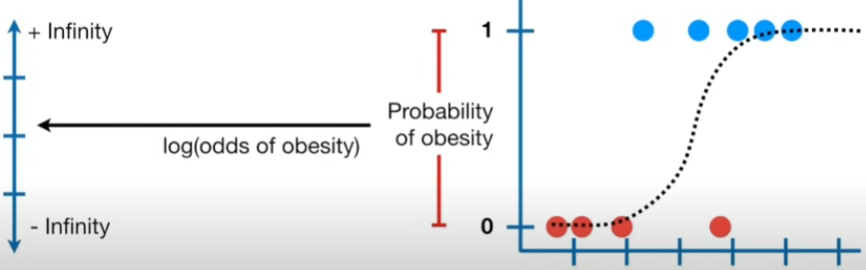
- To solve this problem, the y-axis in logistic regression is transformed from the "probability of obesity" to the "log(odds of obesity") so, just like the y-axis in linear regression, it can go from -infinity to infinity
- we use logit function $log(\frac{p}{1-p})$ to transform the y-axis from a "probability of obesity" scale to a "log(odds of obesity)" scale
    - p, in this case is the probability of a mouse being obese and corresponds a value on the old y-axis between 0 and 1.

    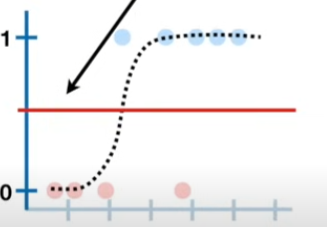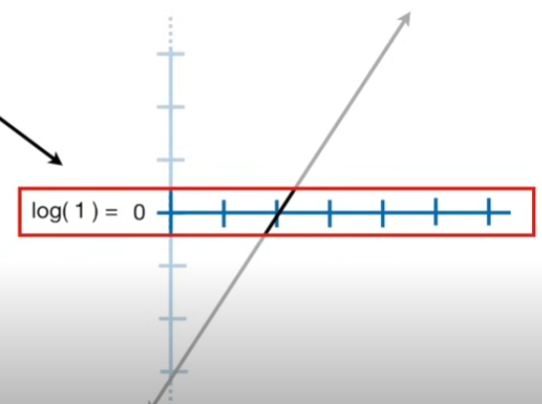
    - the midpoint on the old y-axis corresponds to p = 0.5
    - and we plug $p=0.5$ into the logit function and do the math, we get 0, the center of the new y-axis

    $$ log(\frac{p}{1-p}) = log(\frac{0.5}{1-0.5}) = log(1) = 0 $$

    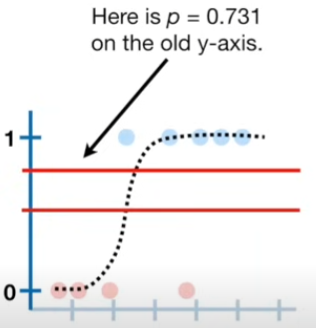 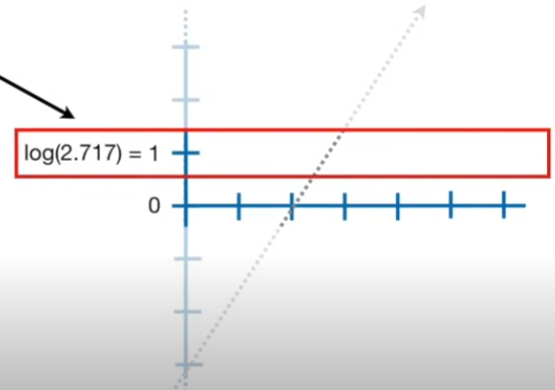
    - if we we plug $p=0.731$ into the logit function and do the math, we get 1
    $$ log(\frac{p}{1-p}) = log(\frac{0.731}{0.269}) = log(2.717) = 1 $$

    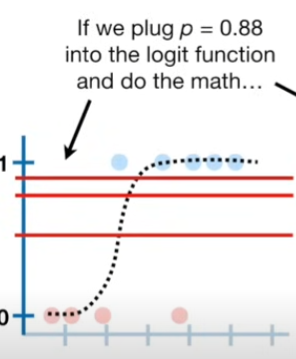 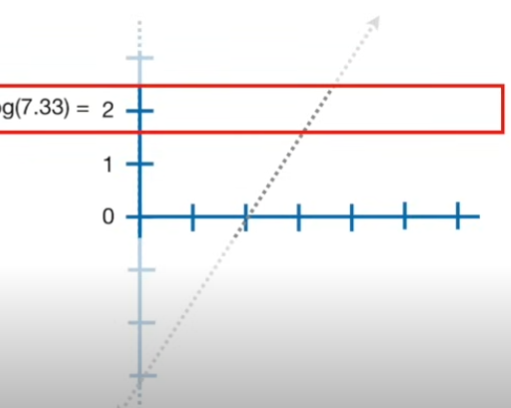
    - if we we plug $p=0.88$ into the logit function and do the math, we get 1
    $$ log(\frac{p}{1-p}) = log(\frac{0.88}{1-0.88}) = log(7.33) = 2 $$

    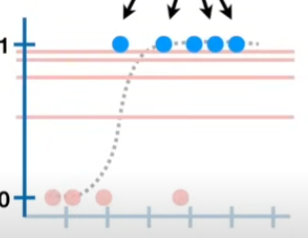 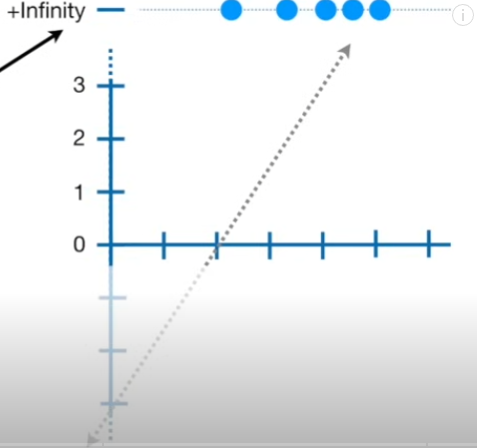
    - Lastly these blue points from the original data are at p=1 
    - if we plug p=1 into the logit function aand do the math, we get $\infty$
    $$ log(\frac{p}{1-p}) = log(\frac{1}{0}) = log(1)-log(0) = 0 - (-\infty) = \infty $$
    - this means the original samples that we labeled "obese" are at positive infinity on the new y-axis.
- As a result, the original y-axis, from 0.5 to 1 is stretched out from 0 to positive infinity on the new y-axis

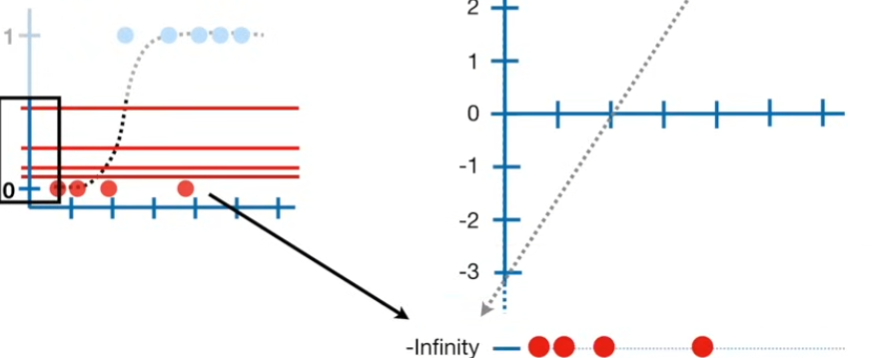
- Similarly, 0.5 to 0 on the old y-axis is stretched out from 0 to -infinity on the new y-axis
- Ultimately, we end up with log(odds of obesity) on the new y-axis, the new y-axis transforms the squiggly line into a straight line.

&nbsp;

**Interpretation of Logistic Regression Coefficients**

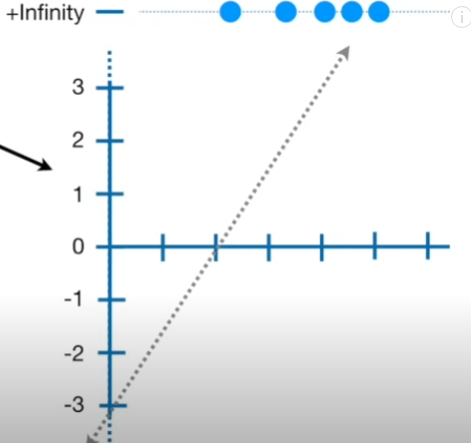
- Even though the graph with the squiggly line is hwat we associate with logistic regression, the coefficients are presented in terms of the log(odds) graph.
- the like is a best fitting line justified through Maximum Likelihood
- for example, the best fitting line is $y=-3.48 +1.83 weight$. The coefficients for the line are what you get when you do logistic regression 

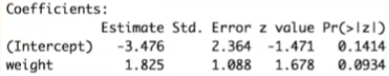
- the first coefficient $-3.476$ is the y-axis intercept when weight = 0 , it means that when weight = 0, the log(odds of obesity) are -3.476. (ie: if you dont weigh anything(weight = 0), the odds are against you being obese) 
- there are standard error and z-value. 
- z-value is the estimated intercept devided by the standard error (ie: it is the number of standard deviations, the estimated intercept is away from 0 on a standard normal curve) --> **Wald's Test**
- the estimate is less than 2 standard deviations away from 0, we know it is not statistically significant, this is confirmed by the large p-value; the area under a standard normal curve that is further than 1.471 standard deviations away from 0.

&nbsp; 

- the second coefficient $1.825$ is the slope. it means that for every one unit of weight gained, the log(odds of obesity) increases by 1.825
- the standard error and z-value are similar.
- the estimate is less than 2 standard deviations from 0, so it is not statistically significant.This is also confirmed with the large p-value

Context: 

Now we test if a discrete variable like "whether or not a mouse has a mutated gene" is related to obesity

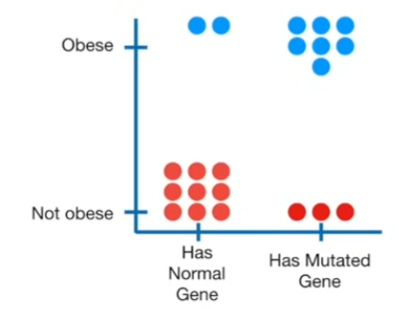
- left: mice with normal gene
- right: mice with mutated gene
- some mice are obese and some are not 
- this type of logistic regression is very similar to how a t-test is done using linear models

&nbsp; 

*How t-test is done using linear models*

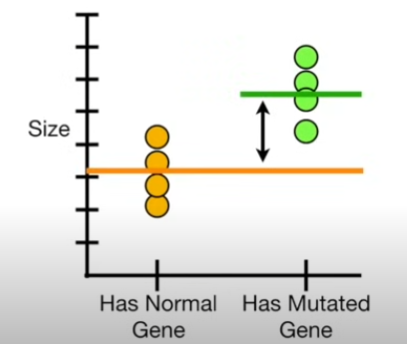
- we fit two lines into the data; 
- The first line represents the mean size for the mice with the normal copy of the gene
- The second line represents teh mean size of the mice with the mutated copy of gene
- These two lines come together to form the coefficients in this equation\

$$ size = mean_{normal} \times B_1 + (mean_{mutant} - mean_{normal}) \times B_2$$

- we then pair this equation with a design matrix to predict the size of a mouse given that is has the normal or mutated version of the gene

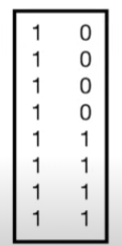
- this is the design matrix for the observed data
- the first column corresponds to the values for $B_1$ and its "turn on the first coefficient, $mean_{normal}$
- the second column corresponds to values for $B_2$ and turns the second coefficient,$(mean_{mutant} - mean_{normal})$, "off" or "on" depending on whether it is a 0 or a 1.
- For example, the first row in the design matrix corresponds to a mouse with a normal copy of the gene. We predict its size by replacing $B_1$ with 1 and replacing $B_2$ with 0, and then we just do the math, and we can see that this mouse is associated with the mean of the normal mice
$$ 
\begin{align*}
size &= mean_{normal} \times 1 + (mean_{mutant} - mean_{normal}) \times  0 \\
&= mean_{normal} + 0 \\
&= mean_{normal}
\end{align*}
$$
- if we take row 5 as example, we know that this row corresponds to a mouse with the mutated gene
- we plug in 1 for $B_1$ and 1 for $B_2$, we see this mouse assiciate with the mean for the mice with the mutated gene
$$ 
\begin{align*}
size &= mean_{normal} \times 1 + (mean_{mutant} - mean_{normal}) \times  1 \\
&= mean_{normal} + difference_{mean_{mutant} - mean_{normal}} \\
&= mean_{normal}
\end{align*}
$$
- when we do a t-test this way, we are basically testing to see if this coefficient,$(mean_{mutant} - mean_{normal})$, is equal to 0

&nbsp; 

*How it apply to logistic regression*

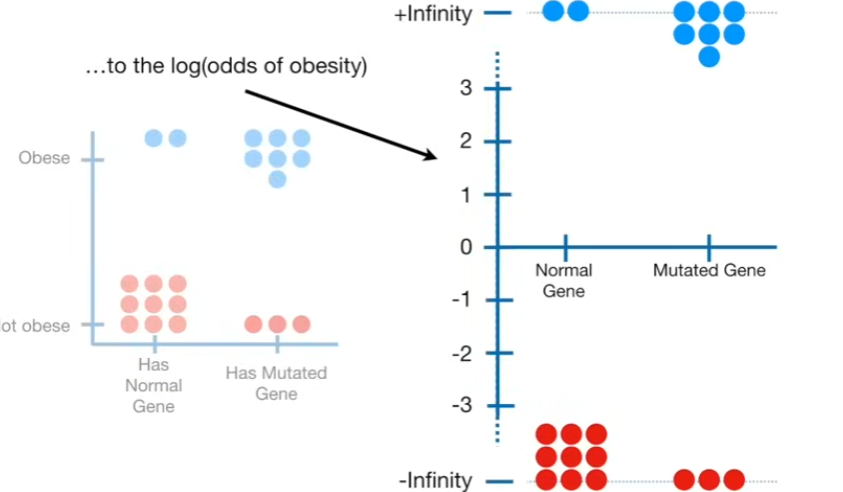
- The first thing we do is transform the y-axis from the probability of being obese to the log(odds of being obesity)

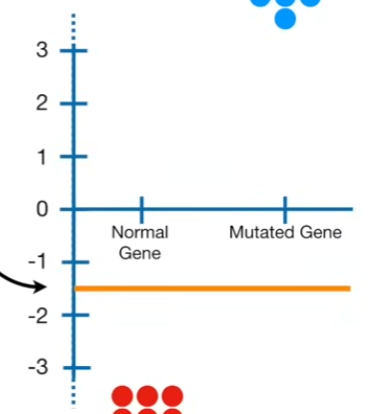
- now we fit 2 lines to the data, for the first line, we take the "Normal Gene" data and use it to calculate the log(odds of obesity) for mice with the nornal gene, let's call this `log(odds gene_normal)`.

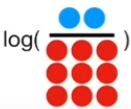$=log(\frac{2}{9})=log(0.22)=-1.5$

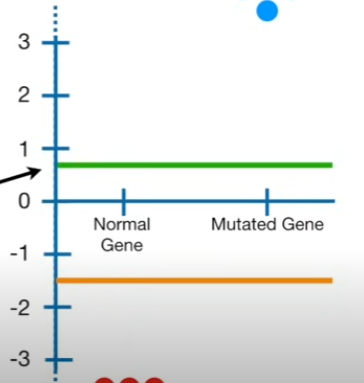
- we then calculate the log(odds of obesity) for the mice with the mutated gene. let's call this `log(odds gene_mutated)`

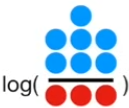$=log(\frac{7}{3})=log(2.33)=0.85$

Notes: 

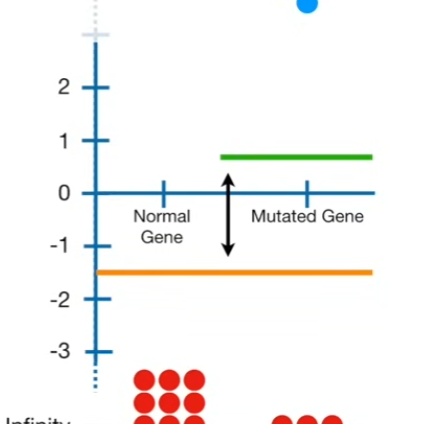

- These two lines come together to form the coefficients in this equation 

$$ 
\begin{align*}
size &= log(odds.gene.normal) \times B_1 + (log(odds.gene.mutated) - log(odds.gene.normal)) \times B_2 \\
&= log(odds.gene.normal) \times B_1 + log(\frac{odds.gene.mutated}{odds.gene.normal})
\end{align*}
$$
- it tells us, on a log scale, how much having the mutated gene increases (or decreases) the odds of a mouse bring obese
- Now we substitude in the numbers

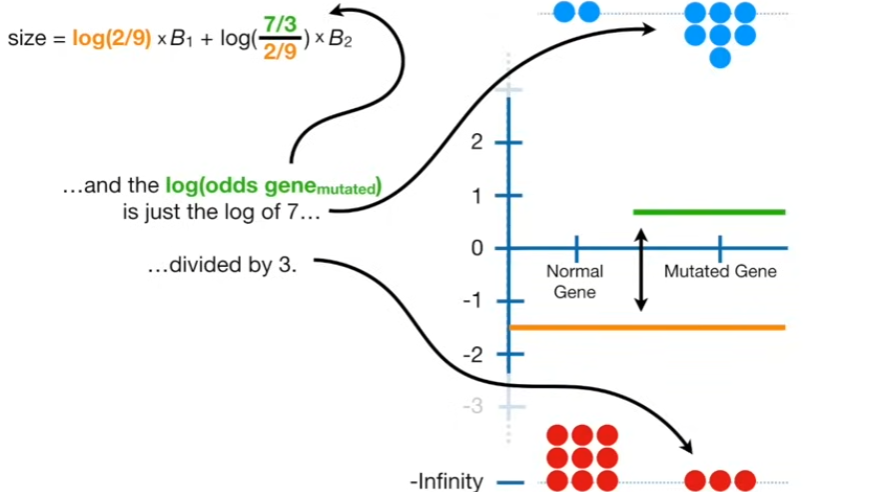
$$ 
\begin{align*}
size 
&= log(odds.gene.normal) \times B_1 + log(\frac{odds.gene.mutated}{odds.gene.normal}) \\
&= log(2/9) \times B_1 + log(\frac{7/3}{2/9}) \\
&= -1.5 \times B_1 + 2.35 \times B_2
\end{align*}
$$

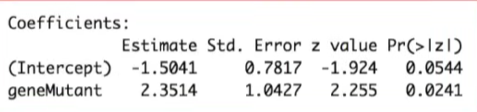
- and those are what we get when we do logistic regression 
- the intercept is the $log(odds.gene.normal)$ and the "geneMutant" term is the **log(odds ratio)** that tells you, on a log scale, how much having the mutated gene increases or decreases the odds of being obese.
- the "z-values"(the Wald's Test values) that tell you jow many standard deviations the estimated coefficients are away from 0 on a standard normal curve

To conclude: 
- in terms of the coefficients, logistic regression is the exact same as good old linear models except the coefficients are in term of log(odds).

&nbsp;

**Fitting a line with Maximum Likelihood**

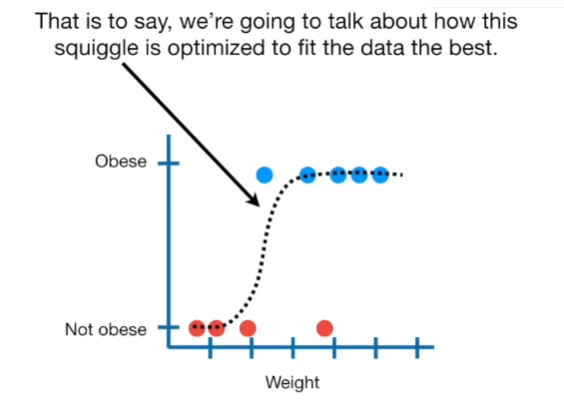

In this example, we are using logistic regression to determine the effect of weight obesity. Our goal is to draw the best fitting squiggle for this data.

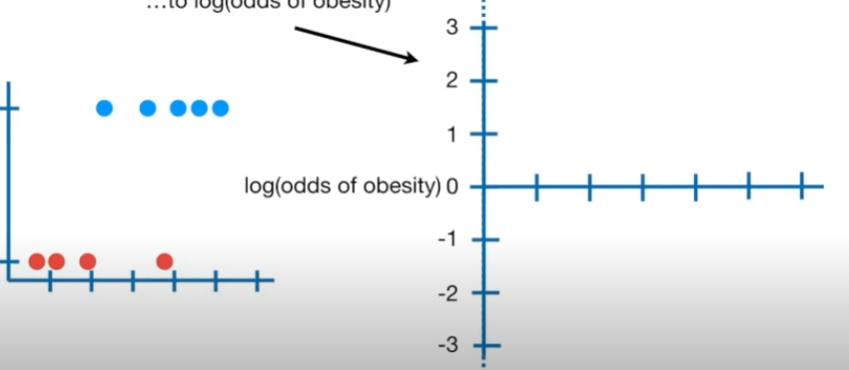
As we all know, in logistic regression, we transform the y-axis from the probability of obesity to log(odds of obesity). we can draw a candidate "best fitting" line on the graph. The only problem is that the transformation pushes the raw data to positive and negative infinity and this means that the residuals( the distance from the data points to the line) are also equal to positive and negative infinity. This means we cant use least-squares to find the best fitting line(like linear regression)

&nbsp;

Instead, we use maximum likelihood,

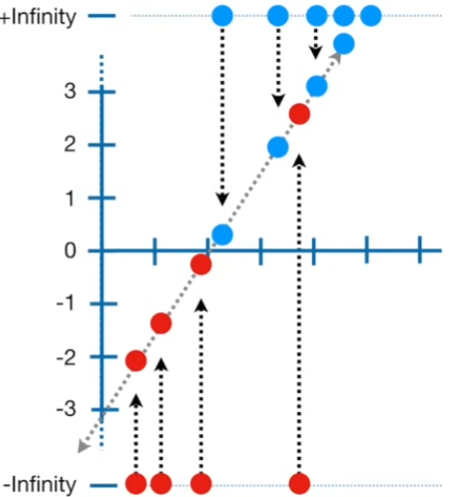
- The first thing we do is project the original data points onto the candidate line. This gives each sample a candidate log(odds) value.

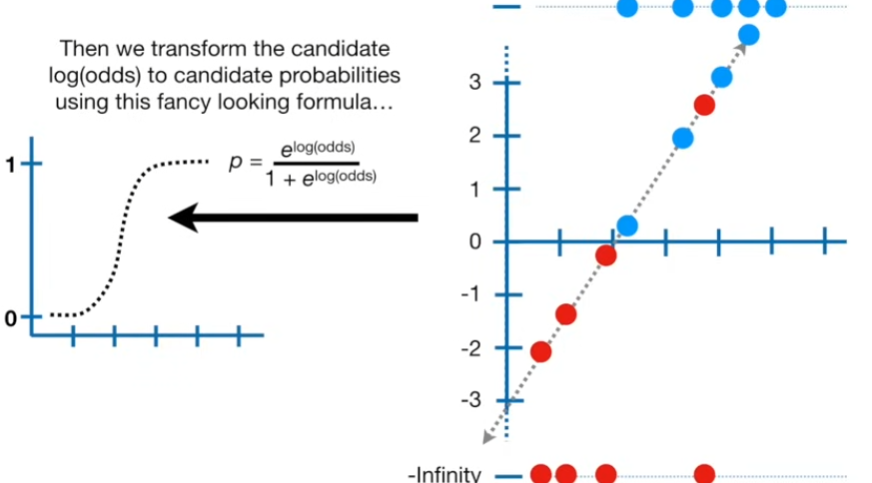
- Then we transform the candidate log(odds) to candidate probabilities using this fancy looking formula,

$$ p = \frac{e^{log(odds)}}{1+e^{log(odds)}}$$

which is just a reordering of the transformation from probability to log(odds)

$$ log(\frac{p}{1-p}) = log(odds) $$

![Screenshot 2025-07-12 203356.png](<attachment:Screenshot 2025-07-12 203356.png>)

for example, we substitite -2.1 for the log(odds)

$$ p = \frac{e^{-2.1}}{1+e^{-2.1}} =0.1 $$

then give us a y-coordinate on the squiggle.

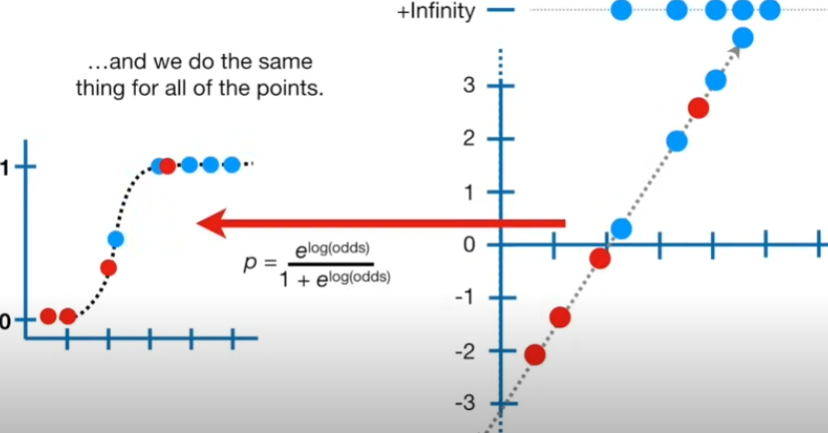

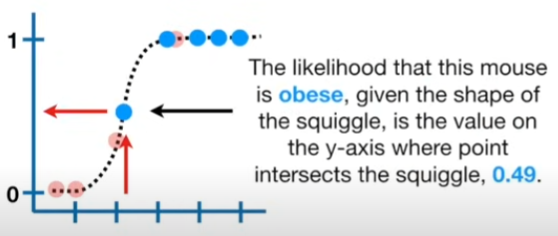
- Now we use the observed status (obese or not obese) to calculate their likelihood given the shape of the squiggly line.
- the likelihood that this mouse is obese, given the shape of the squiggle, is the value on the y-axis where point intersects the squiggle, 0.49, In other words, the likelihood that this mouse is obese is the same as the predicted probability
- in this case, the probability is not calculated as the area under a curve, but instead is the y-acis value, and that's why it is the same as the likelihood

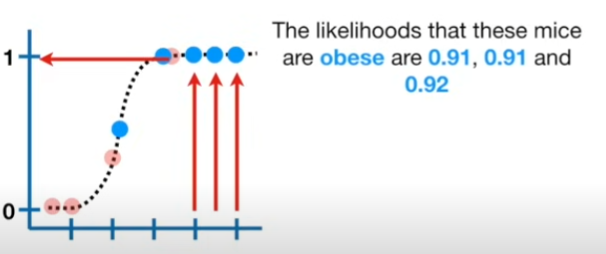

- likelihood of all of the obese mice is just the product of the individial likelihoods
$ likelihood = 0.49 \times 0.9 \times 0.91 \times 0.92 \times ... $

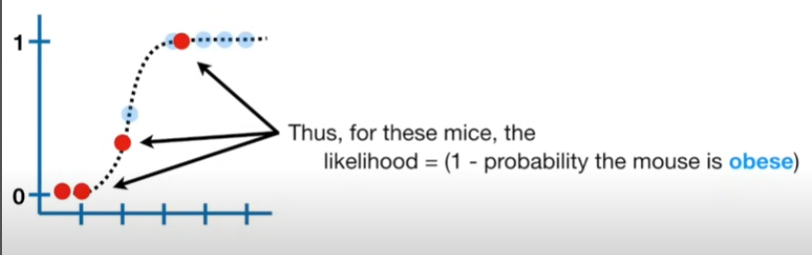
- Thus, for these mice, the likelihood = ( 1- probability the mouse is **obese**)

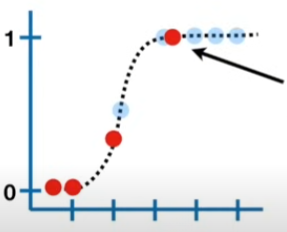
- the probability that this mouse is obese is 0.9, so the probability and likelihood that it is not obese is (1-0.9)

Now we can include the individual likelihoods for the mice that are not obese to the equation for the overall likelihood.
$$ likelihood = 0.49 \times 0.9 \times 0.91 \times 0.92 \times 0.91 \times (1-0.9) \times (1-0.3) \times (1-0.01) \times (1-0.01) $$

Note: Although it is possible to calculate the likelihood as the product of the individual likelihoods, statisticians prefer to calculate the **log of likelihood** instead. Either way workds becasue the squiggle that maximizes the likelihood is the same one that maximizes the log of the likelihood

$$ log(likelihood) = log(0.49) + log(0.9) + log(0.91) + log(0.91) + log(0.92) + log(1-0.9) + log(1-0.3) + log(1-0.01) + log(1-0.01) $$

with the log of the likelihood, we add the logs of the individual likelihoods instead of multiplying the individual likelihoods. Thus the log-likelihood of the data given the squiggle is -3.77

$$ log(likelihood) = -3.77 $$ 

and this means that the log-likelihood of the original like is -3.77.

Now we rotate the like and calculate its log-likelihood by projecting the data onto it, transforming the log(odds) to probabilities and then calculating the log-likelihood, and the final values for the log-likelihood is -4.15 (so this one is not as good as the first line).

We keep repeating and get the maximum, then that will be the best fitted line that maximizes the likelihood

&nbsp;

**$R^2$ and p-values**

To know whether the best fitted line in logistic regression is useful or not, we need to calculate the $R^2$, unlike linear regression, there are many ways to calculate it. We will focus on one that is commonly used and is easily calculated from the output that R gives you

Recap: 
- In Linear Regression, $R^2$ and the related p-values are calculated using the residuals
- in brief, we square the residuals and then add them up. I call this **SS(fit)**, for "sum of squares for the REsiduals around the best fitting line"
- and we compare that to the sum of squared residuals around the worst fitting line, the mean of the y-axis values. This is called **SS(mean)**.
- $R^2$ compares a measure of a good fit, **SS(fit)** to a measure of a bad fit, **SS(mean)**
$$ R^2 = \frac{SS(mean) - SS(fit)}{SS(mean)}$$
- $R^2$ is the percentage of variation around the mean that goes away when you fit a line to the data.(percentage of variation explain by the residuals)

&nbsp;

**$R^2$ in logistic regression**
- like linear regression, we need to find a measure of good fit to compare to a measure of a bad fit

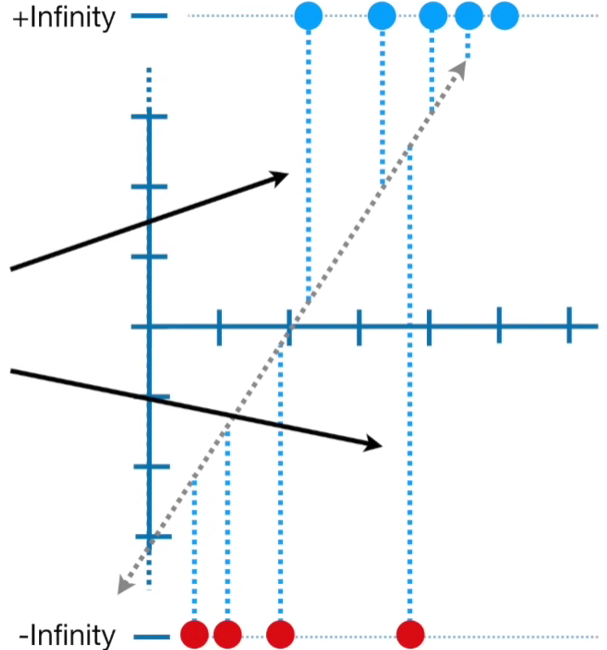
- Unfortunately, the residuals for logistic regression are all infinite, so we can't use them

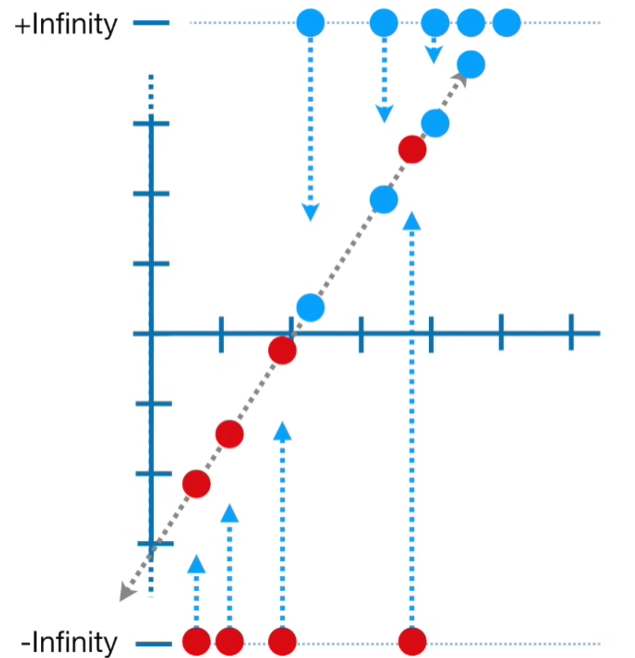
- but we can project the data onto the best fitting line and then we translate the log(odds) back to probabilities and lastly calculate the log-likelihood of the data given the best fitting squiggle

$$ log(likelihood) = log(0.49) + log(0.9) + log(0.91) + log(0.91) + log(0.92) + log(1-0.9) + log(1-0.3) + log(1-0.01) + log(1-0.01)$$

$$LL(fit) = -3.17$$

- we can call this LL(fit), for the log-likelihood of the fitted like, and use it as a subsitute for SS(fit)

Now we need a measure of a poorly fitted line that is analogous to SS(mean)
- we do this by calculating the log(odds of obesity) without taking weight into account
- The overall log(odds of obesity) is just the total number of obese mice dicided by the total number of mice that are not obese. Then we jsut take the log of the whole thing and do the math. (eg: log(5/4) = 0.22), in this case, we will get a horizontal line on 0.22.

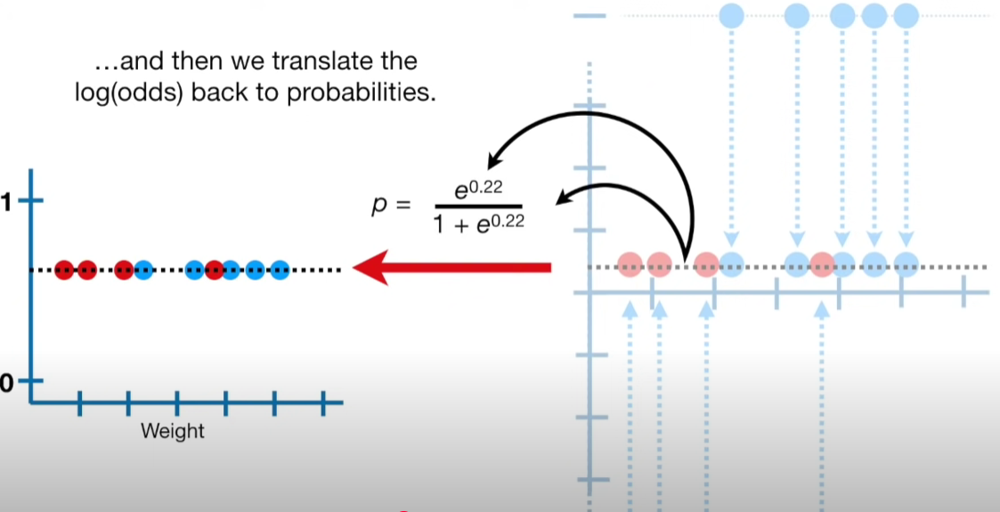
- we project the data onto this like and we translate the log(odds back to probabilities)
- that gives us a horizontal like at p = 0.56

Note:

The overall log(odds), 0.22, translates to the overall probability of being obese, 0.56. Ie: we can arrive at the same solution by calculating the overall probability of obesity
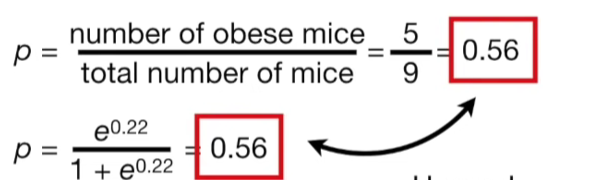

- Now calculate the log-likelihood of the data given the overall probability of obesity 

$$ log(likelihood) = log(0.55) + log(0.55) + log(0.55) + log(0.55) + log(0.55) + log(1-0.55) + log(1-0.55) + log(1-0.055) + log(1-0.55) = -6.18$$

$$LL(overall. probability) = -6.18$$

- we will call this LL( overall probability) and use it as a substitute for SS(mean)

then,
$$ R^2 = \frac{LL(overall.probability) - LL(fit)}{LL(overall.probability)}$$

when the model is a poor fit, the log-likelihood for logistic regression is a relatively large negative value, when the model is a good fit, the log-likelihood for logistic regression is value close to zero. Log-likelihoods for logistic regression will always be between 0 and -infinity becasue we are taking logs of values between 0 and 1

**P-values in logistic regression**

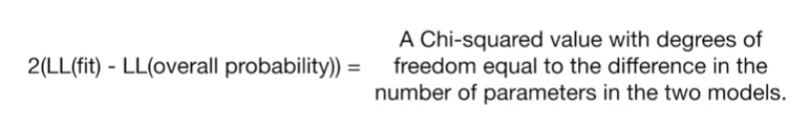

- LL(fit) has 2 parameters since it needs estimates for a y-axis intercept and a slope
- LL(overall probability) has 1 parameter since it only needs an estimate for a y-axis intercept
- `Degree of freedom = 2-1 = 1` 

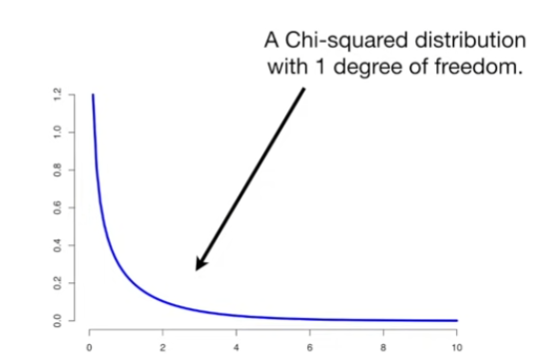
- in the worst case scenario, LL(fit) = LL(overall probability) and the whole thing = 0 , `2(LL(fit) - LL(overall probability)) = 0`.

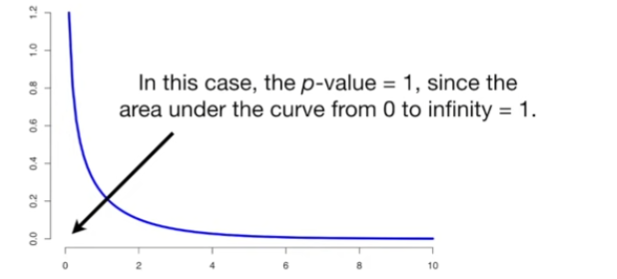

However, most of the time LL(fit) will be closer to 0 than LL(overall probability) and since the log-likelihoods are negative, `2(LL(fit) - LL(overall probability)) = Chi-squared value`

（not complete）cannot understand

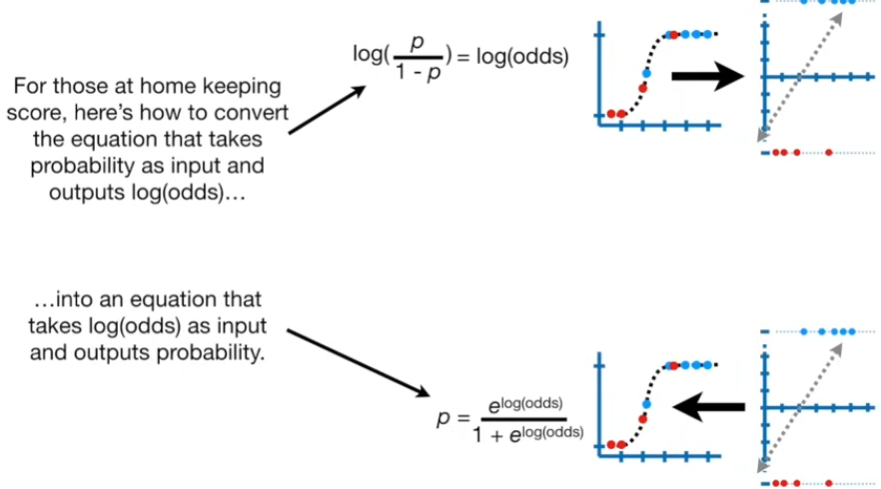

### Support Vector Machine 

**Context:** 
- Let's start by imagining we measured the mass of a bunch of mice

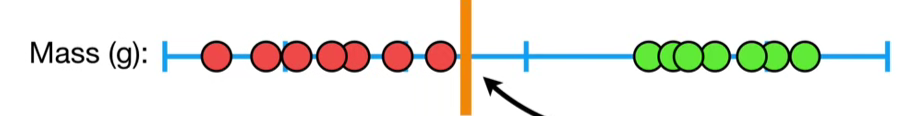
- red dots represent mice that are not obese
- green dots represent mice that are obese
- based on these observations, we can pick a threshold. if the new observation that has less mass than the threshold -> not obese; if the new observation that has more mass than the threshold -> obese
- to achieve better classification, we normally use the observations on the edges of the cluster and use the midpoint between them as the threshold

&nbsp;

**Terminology:**
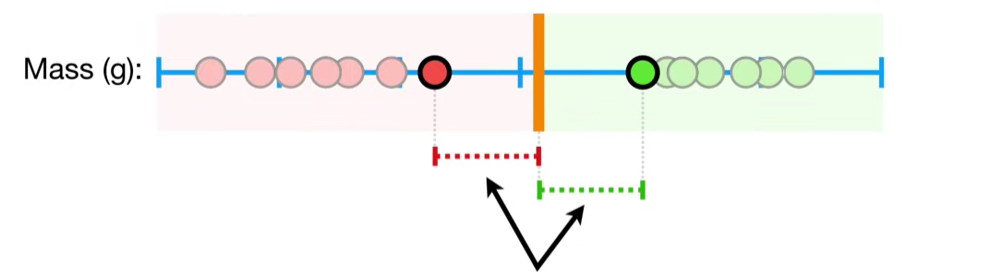
- margin: the shortest distane betweent the observations and the threshold
- Maximal margin Classifier: when we use the threshold that gives us the largest margin to make classifications

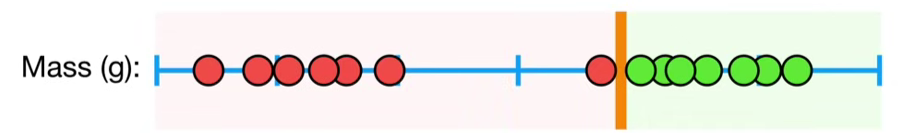
- Maximal Margin Classifiers are super sensitive to outliers in the training data. This makes them pretty lame

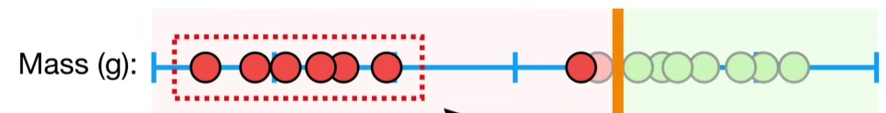
- the Maximum margin classifier might be super close to the obese observations, then very far from the majority observations that are not obese, might make us wrongly classify as not obese even though it is far away from the majority not obese observations

&nbsp;

**Can we do better?**
- Soft Margin: when we allow misclassifications, the distance between the observations and the threshold.

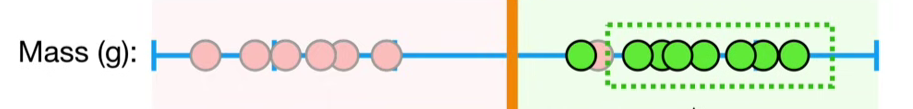
- we need to allow misclassification, when we have new observations, we will classify as obese, and that make sense because it is closer to most of the obese observations.
- Choosing a threshold that allows misclassifications is an example of Bias/Variance Tradeoff that palgues all of machine learning 
- in other words, before we allow misclassifications, we picked a threshold taht was very sensitive to the training data(low bias), perform poorly when we got new data(high variance). In contrast, when we picked a threshold that was less sensitive to the training data and allowed misclassifications(higher bias), it perform better when we have new observation (lower variance).

**How to decide which soft margin is better**
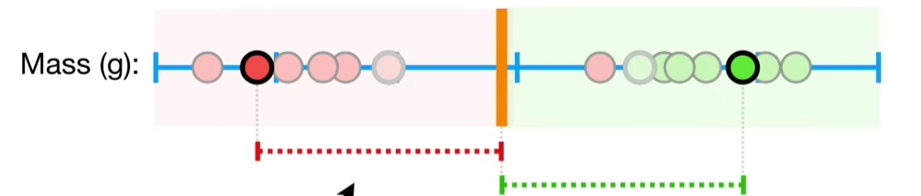 vs 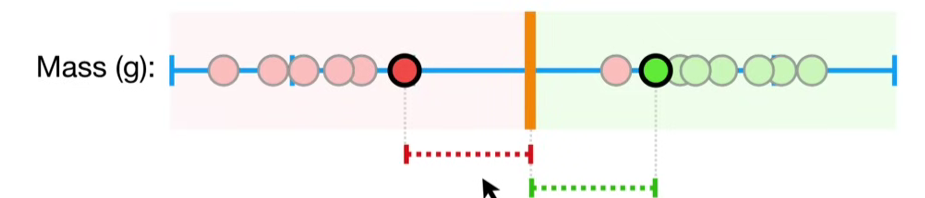

- we use **Cross Validation** to determine how many misclassifications and observations to allow inside of the soft margin to get the best classification

**Terminology:**
- Support Vector Machine(Soft Margin Classifier): When we use a Soft Margin to determine the location of a threshold, then we are using Soft Margin Classifier to classify observations.
- Support vectors: The observations on the edge and within soft margin

**Notes:**

if each observations has a mass and height measurement, then data would be 2-Dimensional.
- 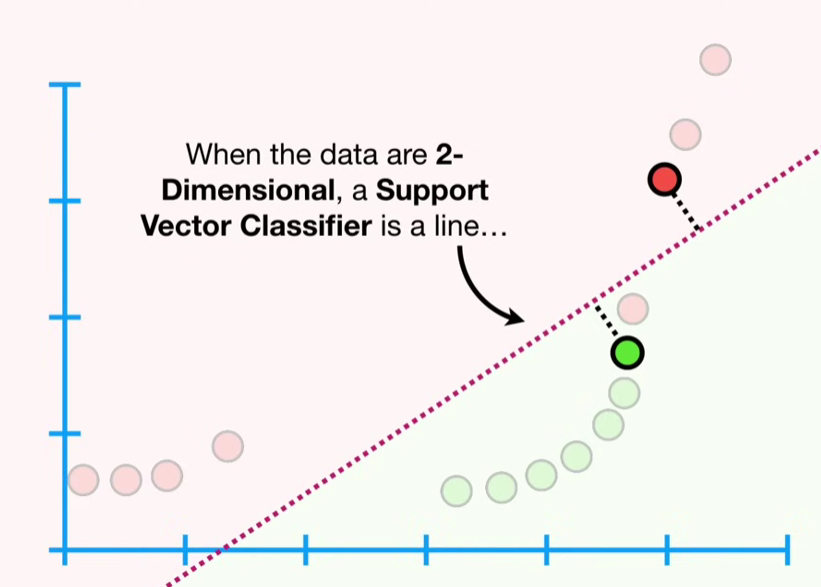
- 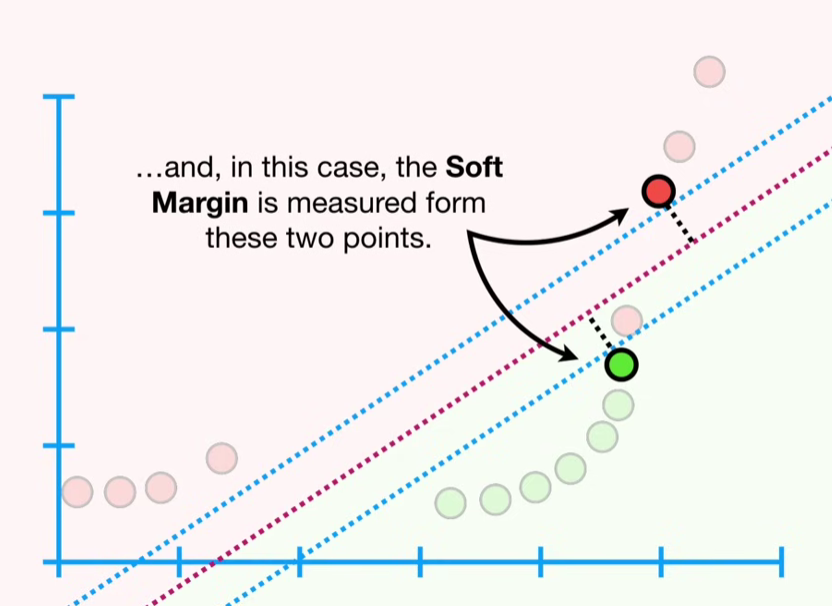
- the blue parallel lines give us a sense of where all of the other points are in relation to the Soft Margin
- Just lieke before, we used Cross Validation to determine that allowing this misclassification results in better classification in long run.

if each observations has a mass, height and Age, then data would be 3-Dimensional etc etc
- 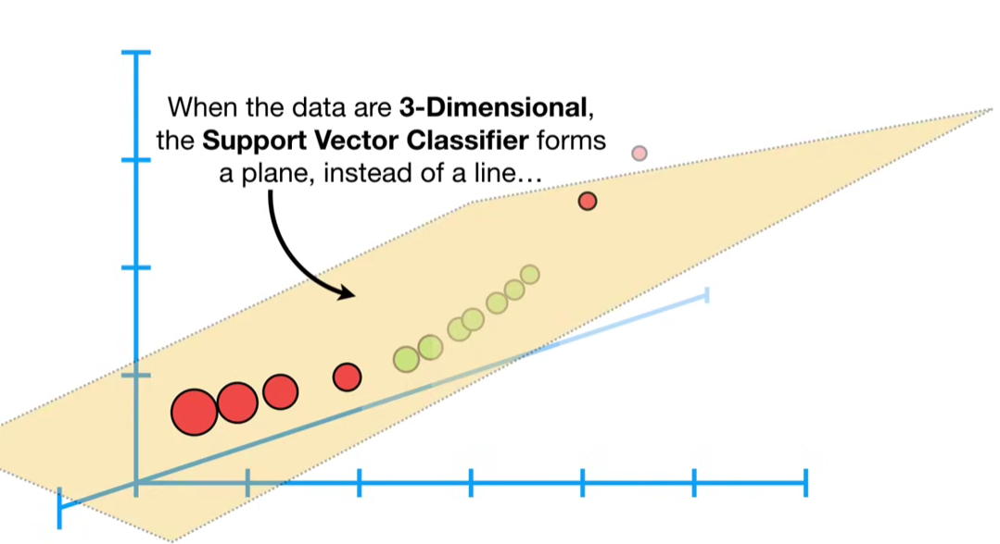
- and we classify new observations by determining which side of the plane they are on

summary: 
- when the data is 1-Dimensional, then the supprt vector classifier is a single point on a line
- when the data is 2-Dimensional, then the supprt vector classifier is a line
- when the data is 3-Dimensional, then the supprt vector classifier will be a 2 dimensional plane
- when the data is 4 or more dimensional, then the support vector classifier will be a hyperplane

&nbsp;

**What happened when there are a lot of overlapping**

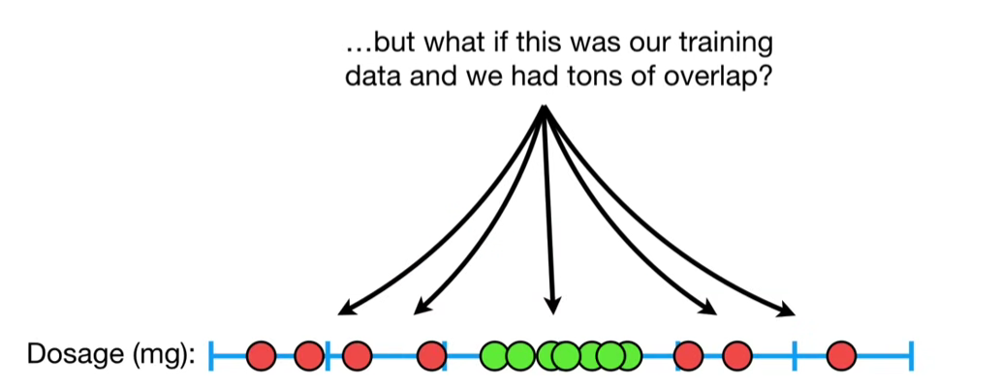

- red dots represent patients that were not cured; green dots represent the patients that were cured
- it only works when the dosage is just right, too large or too less will not cure the patient
- Now, no matter where we put the classifier, there will be alot missclassification
- Can we do better than Maimal Margin Classifiers and Support Vector Classifiers? 

&nbsp;

**Support Vector Machine**

The main ideas behind **Support Vector Machines** are
1) Start with data in a relatively low dimension...

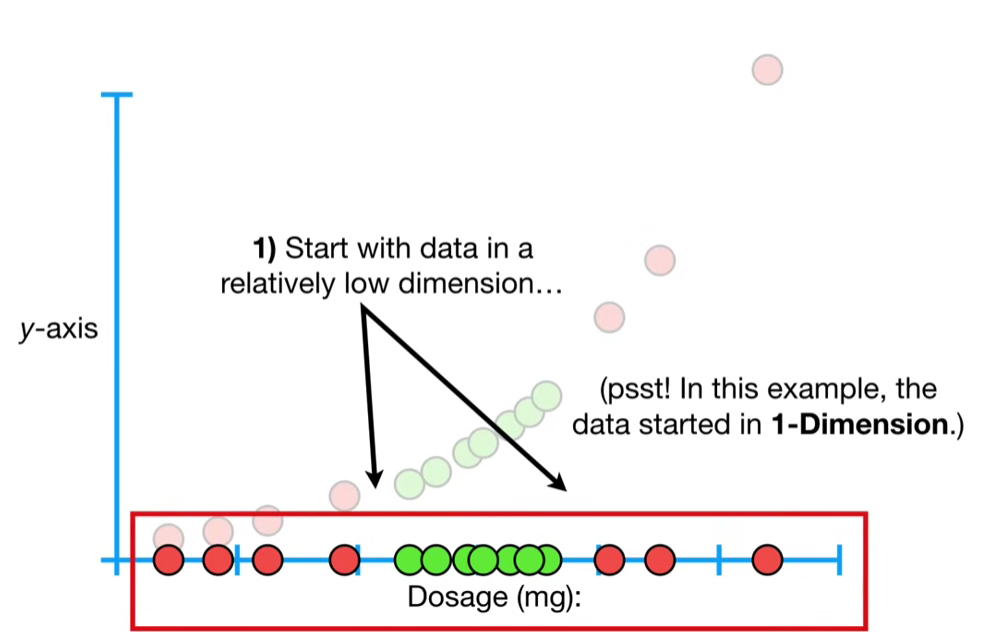

2) Move the data to the higher dimension, based on y-axis (y = x^2) 

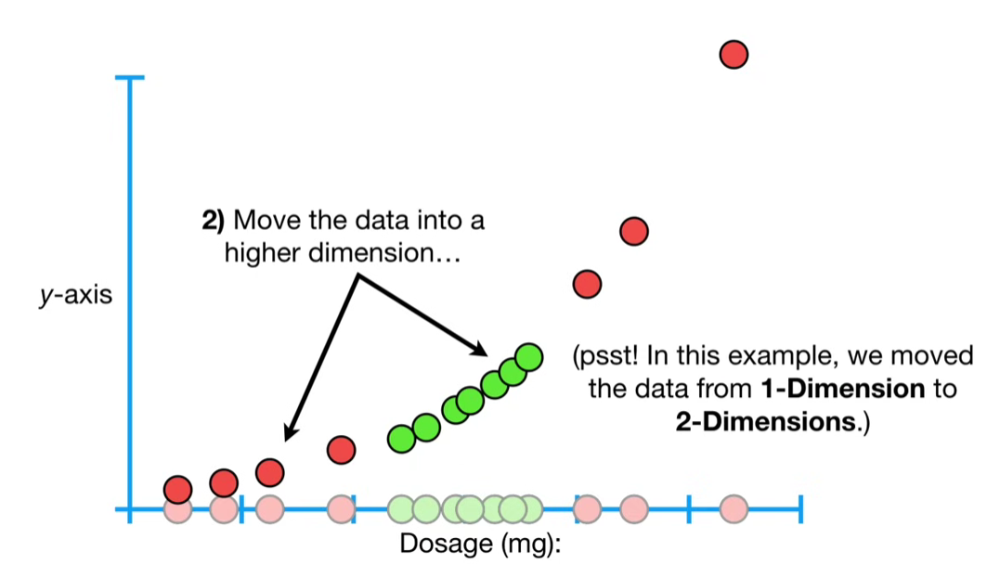

3) Find a Support Vector Classifier that separates the higher dimensional data into two groups

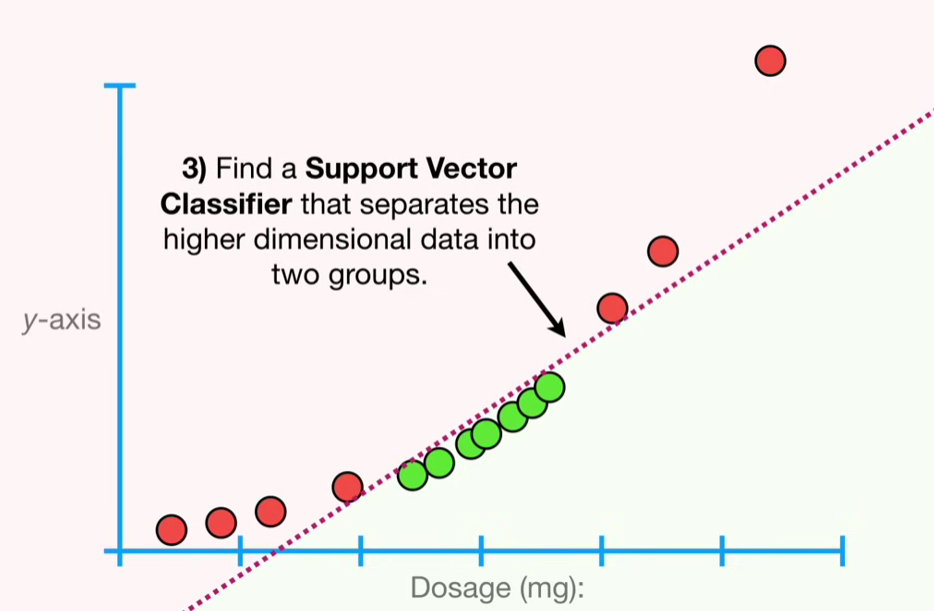

Notes: 

You may be wondering why we decided to create y-axis coordinates with $Dosage^2$ , in other words, how do we decide to transform the data? 
- In order to make the mathematics possible, Support Vector Machines use something called **Kernel Functions** to systematically find **Support Vector Classifiers** in higher dimensions

**Polynomial Kernel**
- This kernal systematically increases dimensions by setting `d`, the degree of the polynomial and the relationships between each pair of observations are used to find a **Support Vector Classifier**
- 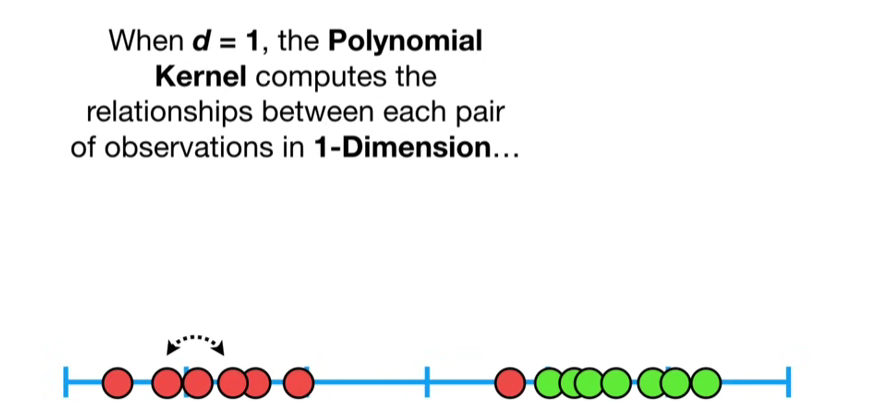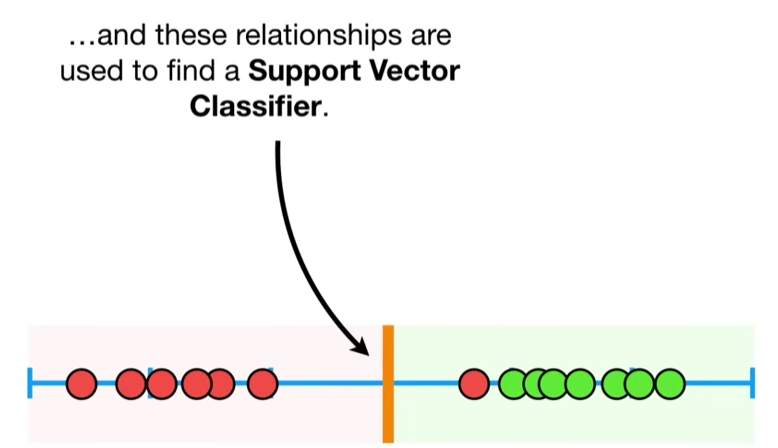
- 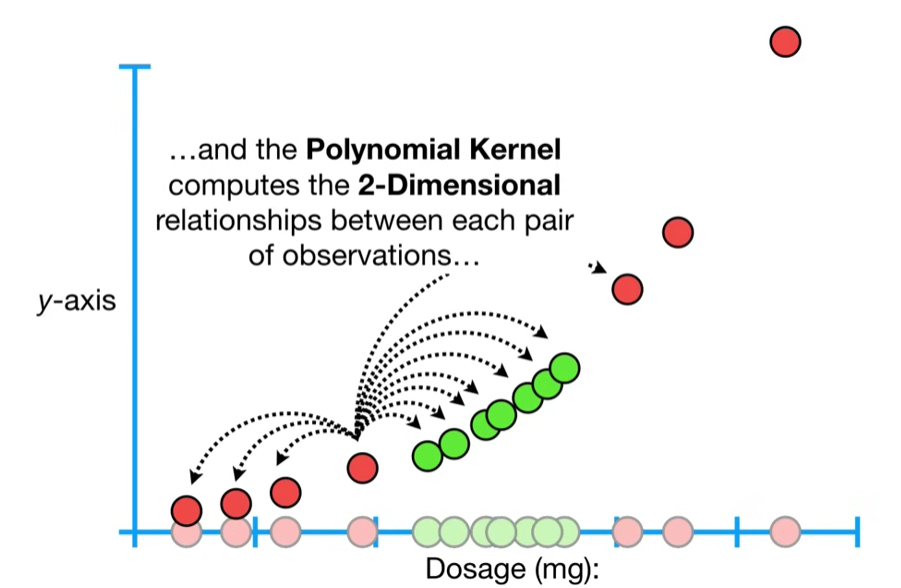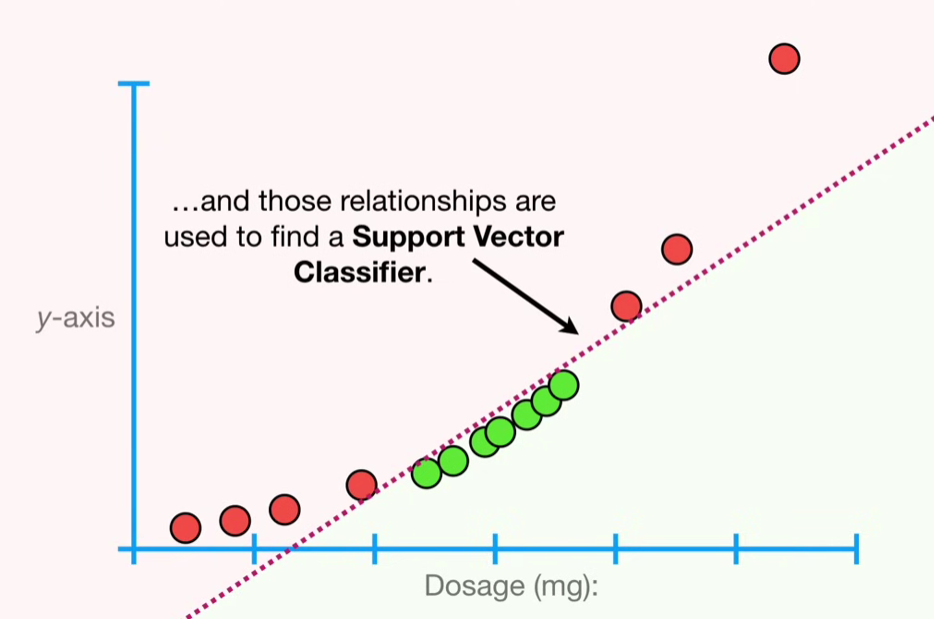
- 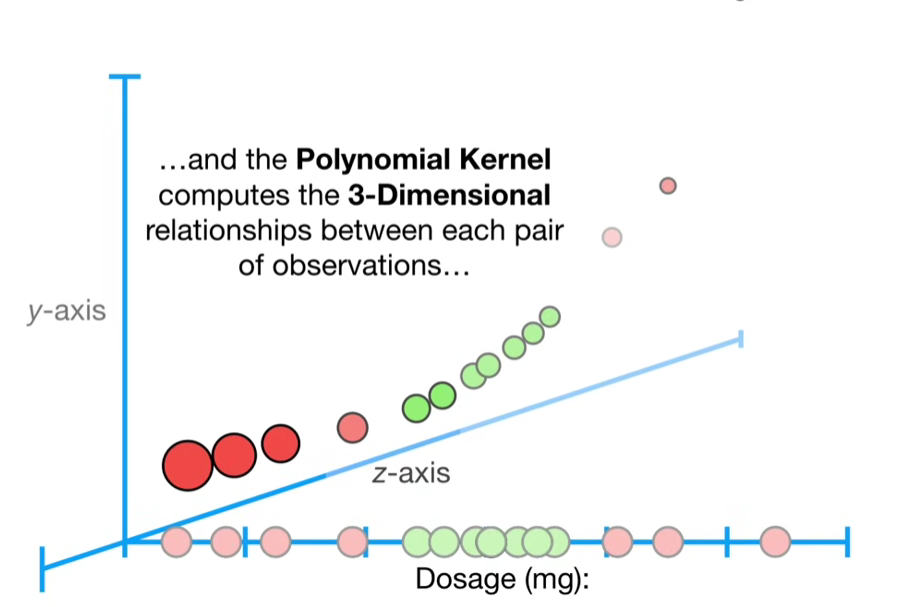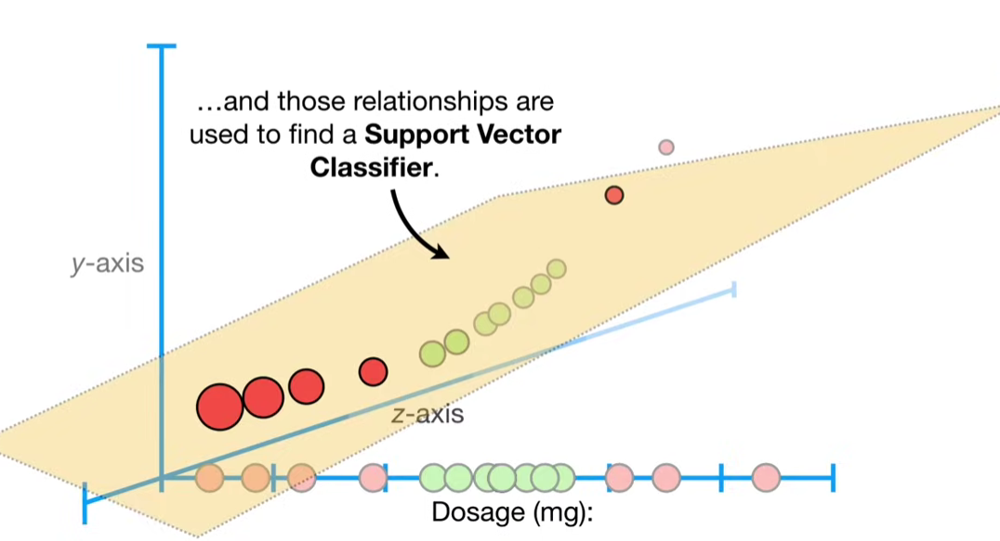

**Radial Kernal(Radial Basis Function Kernel)**
- Radial Kernel finds support vector classifiers in infinite dimensions
- it behaves like a Weighted NEarest Neighbor model (ie: the closest observations have alot of influence on how we classify the new observation and observations that are further away have relatively little influence on the classification)

Notes: 
- Kernel function only calculate the relationships between every pair of points as if they are in the higher dimensions; they don't actually do the transformation
- This trick, calculating the high-dimensional relationships without actually transforming the data to the higher dimension is called **The Kernel Trick**
- **The Kernel Trick** reduces the amount of computation required for Support Vector Machines by avoiding the math that transforms the data from low to high dimensions and it makes calculating relationships in the infinite dimensions used by the **Radial Kernel** possible.

#### Deep Dive into Polynomial Kernel

we will talk about 
- polynomial Kernel parameters
- how Polynomial Kernel calculates high-dimensional relationships

Context: We are still using the drug dosages dataset

**Polynomial Kernel's Parameters**

$$(a * b + r)^d$$

- `a` and `b` refer to two different observations in the dataset (ie: recovered and non-recovered patient)
- `r` determines the coefficient of polynomial 
- `d` sets the degree of the polinomial

For example, set `r` = 1/2 and `d` = 2,
$$
\begin{align*}
(a * b + \frac{1}{2})^2 &= (a * b + \frac{1}{2})(a * b + \frac{1}{2}) \\
&= a^2 b^2 + \frac{1}{2} ab + \frac{1}{2} ab + \frac{1}{4} \\
&= ab + a^2 b^2 + \frac{1}{4} \\
&= (a,a^2,\frac{1}{2}) \dot (a,a^2,\frac{1}{2})
\end{align*} 
$$
- in the dot product, the first coordinate is x-axis coordinates, second is y-axis coordinates, third is z-axis coordinates, but since z-axis coordinates are the same for both points, we can ignore them
- hence, we have x and y-axis coordinates for the data in the higher dimension.
- now we can use the high dimensional relationships to find a **Support Vector Classifier**

Summary:

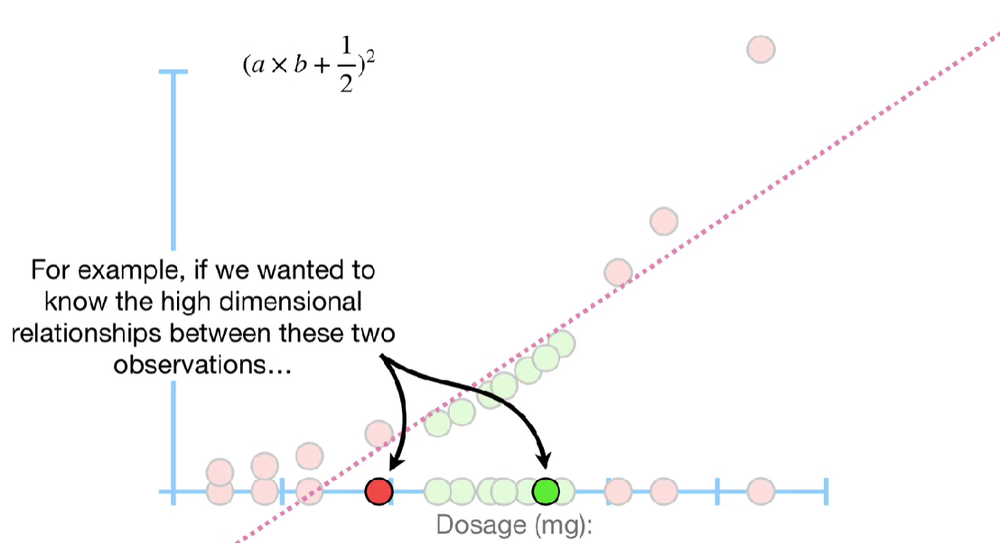
- if we wanted to know the high dimensional relationships between two observations
- when we plug the dosages into the kernal, and do the maths
- and the output (16002.25) is one of the 2-Dimensional relationships that we need to solve for the Support Vector Classifier, even though we didnt actually transform the data to 2-Dimensions
- The **Polynomial Kernel** computes relationship between pairs of observations

Notes: 
- `r` and `d` are determined using **cross validation**
- once we decide on the values for `r` and `d`, we just plug in the observations and do the maths to get the high dimensional relationship

#### Deep dive into the Radial Kernel 

We gonna talk about:
- Radial kernel parameters
- How Radial Kernel calculates high-dimensional relationships
- How radial kernel works in infinite dimensions

Context: We are still using the drug dosages dataset

**Radial Kernel Parameters**
- One way to deal with overlapping data is to use **Support Vector Mahchine** with a **Radial Kernel**(Radial Basis Function)

$$ e ^{-\gamma (a-b)^2} $$

- Because the Radial Kernel finds Support Vector Classifiers in infinite dimensions, it's not possible to visualize what it does.
- the Radial Kernel behaves like a **Weighted Nearest Neighbor** model. In other words, the closest observations (aka the nearest neighbors) have a lot of influence on how we classify the new observations

&nbsp;

**How the Radial Kernel determines how much influence each observation on classifying new observations**

$$ e ^{-\gamma (a-b)^2} $$

- `a` and `b` refers to two different dosage measurement
- the differnece between the measurements is then squared, giving us the squared distance between the two observations. The amount of influence is one observation has on another is a function of the squared distance
- $\gamma$ is determined by cross validation. It scales the squared distance and thus scales the influence.

For examples,
- If we set $\gamma = 1 $ , and plug in the **Dosages** from two observations that are relatively close to each other

$$
e ^{-(2.5-4)^2} 
&= e^{-(-1.15)^2}
&= e^{-2.25}
&=0.11 
$$

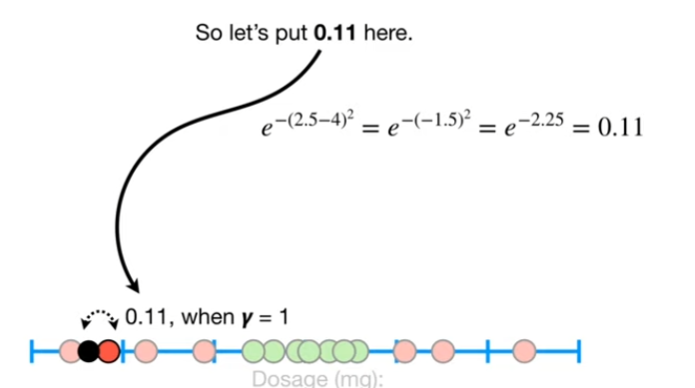

- If we set $\gamma = 2 $ , and plug in the **Dosages** from two observations that are relatively close to each other

$$
e ^{-2(2.5-4)^2} 
&= e^{-2(-1.15)^2}
&= e^{-2*2.25}
&=0.01 
$$

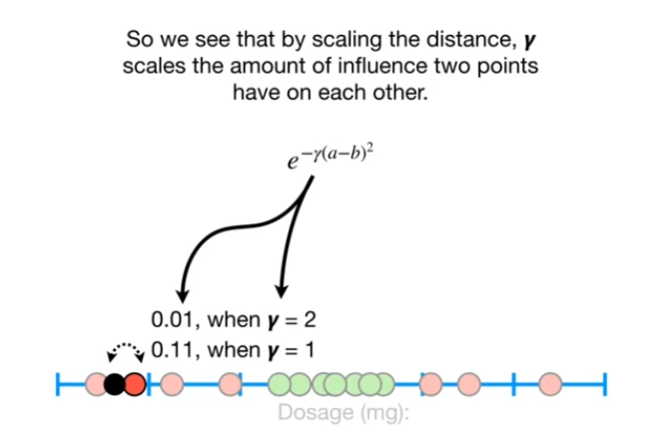

- if we plug in the dosages that are relatively far from each other, and determines the influence

$$
e ^{-(2.5-16)^2} 
= e^{-(-13.5)^2}
= e^{-182.25}
\approx 0 
$$

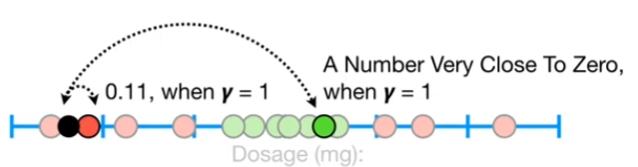
- thus the further two observations are from each other, the less influence they have on each other

Note:
- just like with **Polynomial Kernel** when we plug values into the **Radial Kernel** we get the high-dimensional relationship (the output fun the radial parameter is the high-dimensional relationship)

&nbsp;

**Using Polynomial to see how Radial Kernel works**
- When r = 0, the Polynomial Kernel simplifies to a single term and gives us a Dot product with a single coordinate

$$ (a \times b + r)^d = (a \times b)^d = a^d b^d = (a^d) \dot (b^d) $$

- When d = 2 , we get $(a^2) \dot (b^2)$, since this dot product only has one coordinate, the new coordinate is just the square of the original measurement on the original axis

For example,

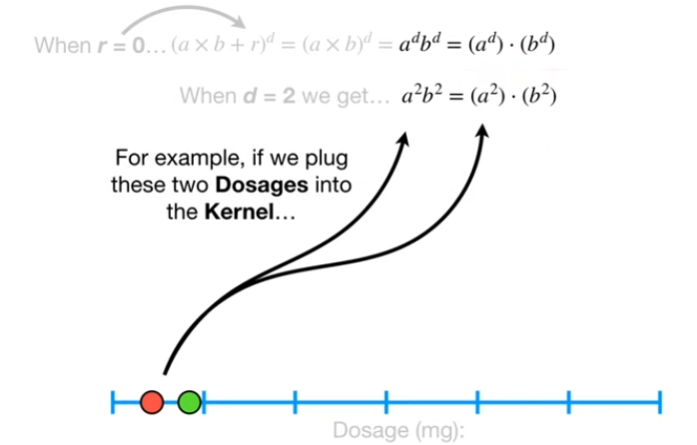

- we get this Dot Product

$$(2.5^2) \dot (4^2)$$
- and that means the new x-axis coordinate for `a` point is $2.5^2 = 6.25$, and the new x-coordinate for `b` point is $4^2 = 16$
- in other words, when $r=0$ and $d=2$, all the polynomial kernel does is shift the data down the original axis
- When $r=0$ and $d=3$, we still only have one coordinate in the dot product, $(a^3) \dot (b^3)$, and we shift the data down further because now we are cubing each value

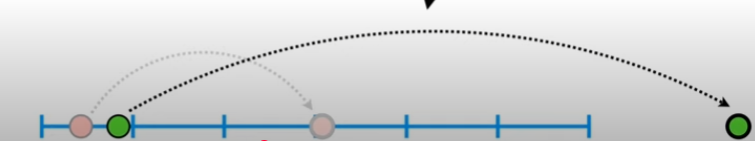

So, setting $r=0$ seems silly because no matter what values we use for $d$, the Dot Products leave the data in the original dimension. 

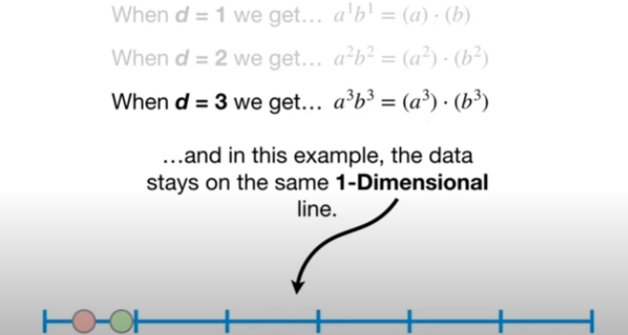

However, it tuens out that setting $r=0$ can result in some pretty awesome stuff.

&nbsp;

Let's talk about what happens if we take a **Polynomial Kernel** with $r=0$ and $d=1$ and add another **polynomial Kernel** with $r=0$ and $d=2$

$$ a^1 b^1 + a^2 b^2 = (a,a^2) \dot (b,b^2)$$

- This gives a Dot Product with coordinates for 2-Dimensions
- and now we can plot the transformed data on x/y-axes
- and find a Support Vector Classifier to separate the data

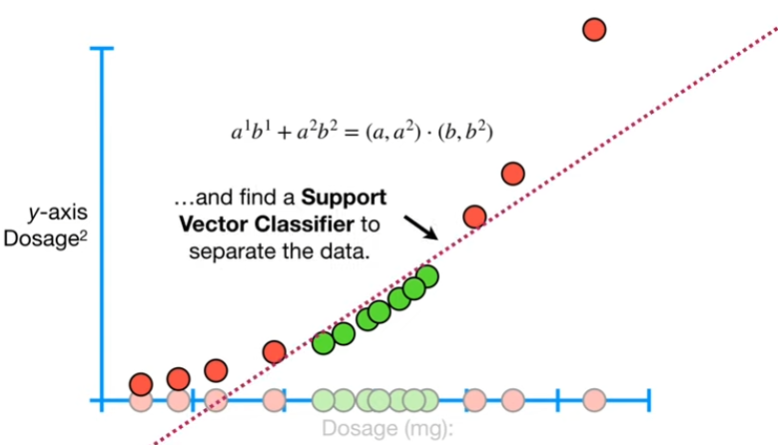

Now, if we added another **Polynomial Kernel** with $r=0$ and $d=3$

$$ a^1 b^1 + a^2 b^2 +a^3 b^3 = (a,a^2,a^3) \dot (b,b^2,b^3) $$

- This gives a Dot Product with coordinates for 3-Dimensions
- and now we can plot the transformed data on x/y/z-axes
- and find a Support Vector Classifier to separate the data 

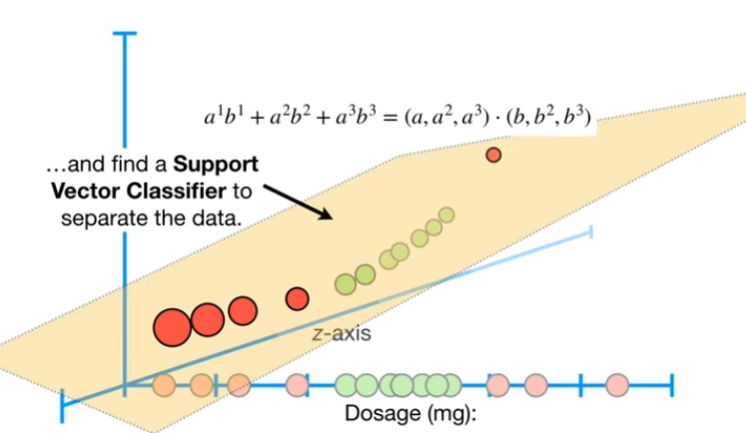

Now, what if we just kept adding **Polynomial Kernels with $r=0$ and increasing $d$ until $d=infinity$?

$$ a^1 b^1 + a^2 b^2 +a^3 b^3 + ... + a^\infty b^\infty = (a,a^2,a^3,...,a^\infty) \dot (b,b^2,b^3,...,b^\infty) $$

- This would give us a Dot Product with coordinates for an infinite number of dimensions
- This is what **Radial Kernel** does

&nbsp;

**Underlying Mathematics of Radial Kernel**

Radial Kernel:

$$ 
\begin{align*}
e ^{-\gamma (a-b)^2} \\
&= e ^{-\gamma (a^2 + b^2 -2ab)} \\
&= e ^{-\gamma (a^2 + b^2)} e^{\gamma 2ab} \\
\end{align*}
$$

Because we can set $\gamma$ to anything, let's set it to $\frac{1}{2}$, so that the `2` goes away

$$ 
\begin{align*}
e ^{-\frac{1}{2}(a^2 + b^2)} e^{\frac{1}{2} 2ab} \\
&= e ^{-\frac{1}{2}(a^2 + b^2)} e^{ab} 
\end{align*}
$$

Now let's create the Taylor Series Expansion of this last term $e^{ab}$

*Taylor Series*

$$ 
f(X) = f(a) + \frac{f'(a)}{1!}(x-a) + \frac{f''(a)}{2!}(x-a)^2 + \frac{f'''(a)}{3!}(x-a)^3 + ... + + \frac{f^{\infty}(a)}{\infty!}(x-a)^\infty
$$

Here, we are setting $f(x) = e^x$ , this is the Taylor Series Expansion of $e^x$

$$ 
e^x = e^a + \frac{e^a}{1!}(x-a) + \frac{e^a}{2!}(x-a)^2 + \frac{e^a}{3!}(x-a)^3 + ... + + \frac{e^a}{\infty!}(x-a)^\infty
$$

- Definition of Taylor Series says that $a$ can be any value as long as $f(a)$ exists, and we will set $a=0$, since $e^0 = 1$ exist.

$$ 
\begin{align*}
e^x 
&= e^0 + \frac{e^0}{1!}(x-0) + \frac{e^0}{2!}(x-0)^2 + \frac{e^0}{3!}(x-0)^3 + ... + + \frac{e^0}{\infty!}(x-0)^\infty \\
&= 1 + \frac{1}{1!}(x) + \frac{1}{2!}(x)^2 + \frac{1}{3!}(x)^3 + ... + + \frac{1}{\infty!}(x)^\infty
\end{align*}
$$

&nbsp;

Going back to the **Radial Kernel**, we can now create the Taylor Series Expansion of this last term

$$ 
e^ab = 1 + \frac{1}{1!}(ab) + \frac{1}{2!}(ab)^2 + \frac{1}{3!}(ab)^3 + ... + + \frac{1}{\infty!}(ab)^\infty
$$

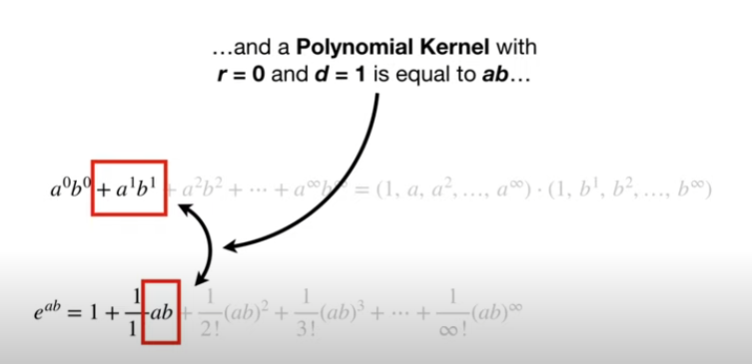
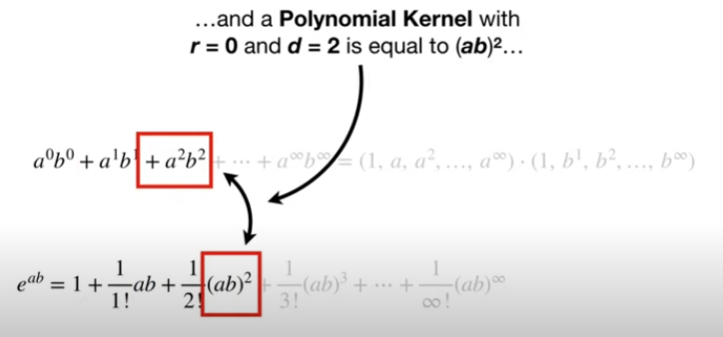
- from here, we can map the taylor series expansion to radial kernel, etc etc
- Thus, each tern in this Taylor Series Expansion contains a Polynomial Kernel with $r=0$ and $d$ going from 0 to infinity

The **Dot Product** of $e^ab$ is 
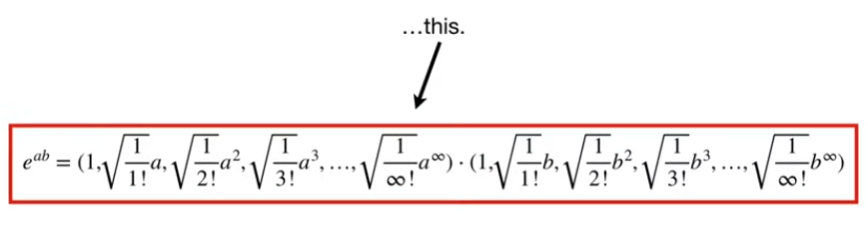

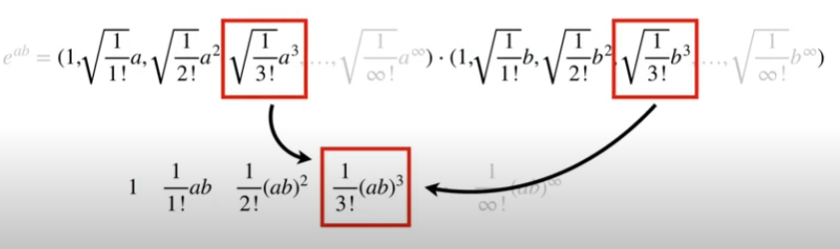

Then, 
$$ 
\begin{align*}
e ^{-\frac{1}{2}(a^2 + b^2)} e^{\frac{1}{2} 2ab} \\
&= e ^{-\frac{1}{2}(a^2 + b^2)} e^{ab} \\
&= e ^{-\frac{1}{2}(a^2 + b^2)} [ (1,\sqrt{\tfrac{1}{1!}}a,\sqrt{\tfrac{1}{2!}}a^2,..., \sqrt{\tfrac{1}{\infty!}}a^\infty) \dot
(1,\sqrt{\tfrac{1}{1!}}b, \sqrt{\tfrac{1}{2!}}b^2, ..., \sqrt{\tfrac{1}{\infty!}}b^\infty)] \\ 
&=  (s,s \sqrt{\tfrac{1}{1!}}a,s \sqrt{\tfrac{1}{2!}}a^2,..., s \sqrt{\tfrac{1}{\infty!}}a^\infty) \dot
(s ,s \sqrt{\tfrac{1}{1!}}b,s \sqrt{\tfrac{1}{2!}}b^2, ...,s \sqrt{\tfrac{1}{\infty!}}b^\infty)
\end{align*}
$$
, where $s = \sqrt{e^{-\tfrac{1}{2}(a^2+b^2)}}$

- we can see that the **Radial Kernel** is equal to a Dot Product that has coordinates for an infinite number of dimensions
- that means when we plug numbers into the Radial Kernel, the value we get at the end is the relationship between the two points in **infinite-dimensions**


## Decision Tree

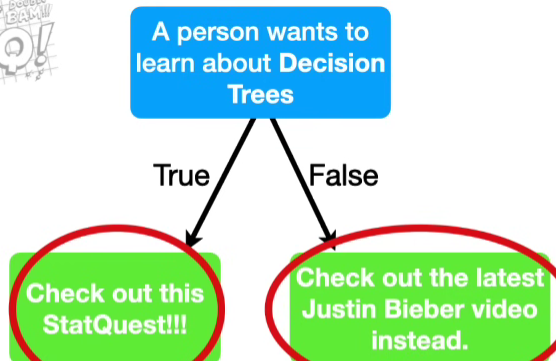

In general, a **Decision Tree** makes a statement, and then make a decision based on whether or not the statement is True or False.
- When a Decision Tree classifies things into categories, it's called **Classification Tree**
- When a Decision Tree predicts numerical values, it's called a **Regression Tree**

Context: 

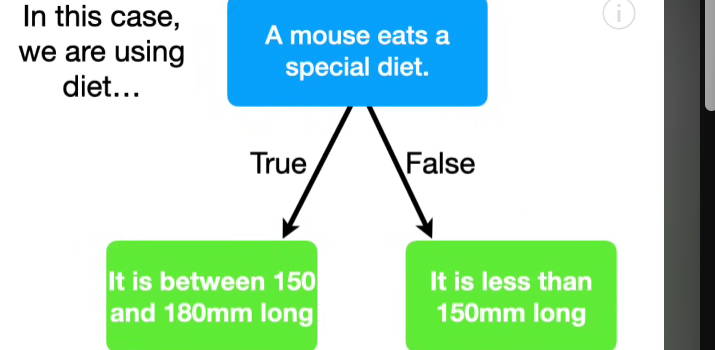
- In this case, we are using diet to predict a numeric value for mouse size

### Classification Trees

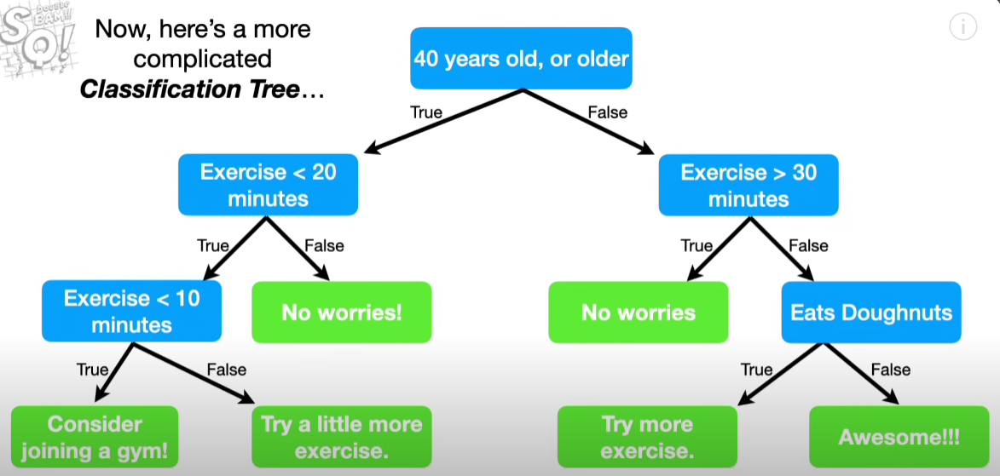
- it combines numeric data with yes/no data, means it allows us to mix data types in the same tree
- Numeric thresholds can be different for the same data (blue nodes)
- final classification can be repeated

*How classification Tree works?*

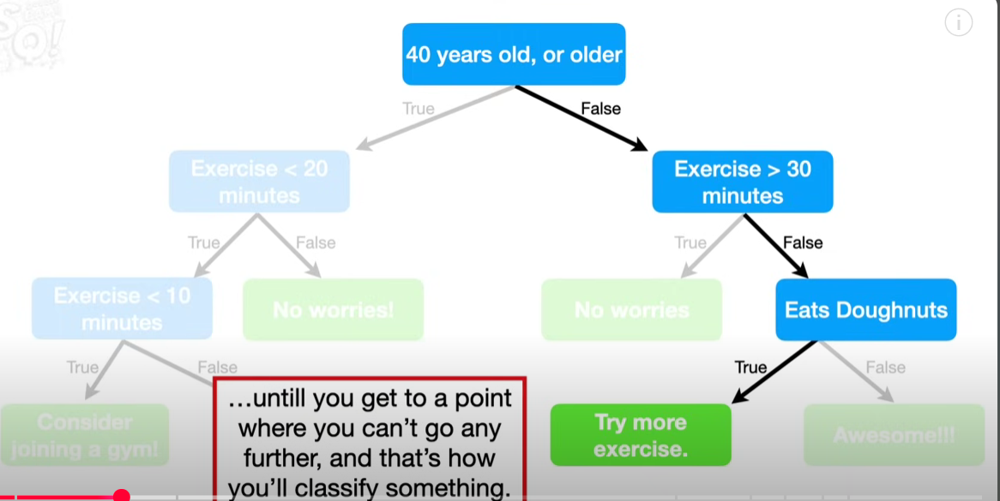
- We start from the top and work our way down until you get to a point where you can't go any further and that's how you will classify something

*Terminology*

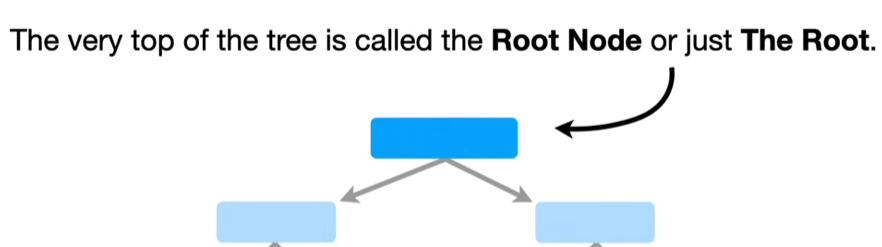
- Root Node/ The Root: the very top of the tree

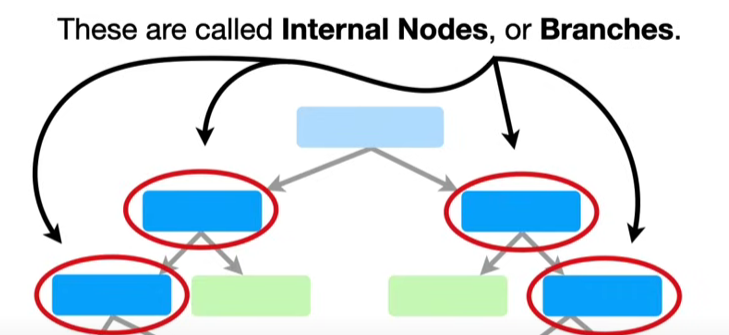
- Internal nodes/Branches: The nodes that have arrows pointing to them and they have arrows pointing away from them.

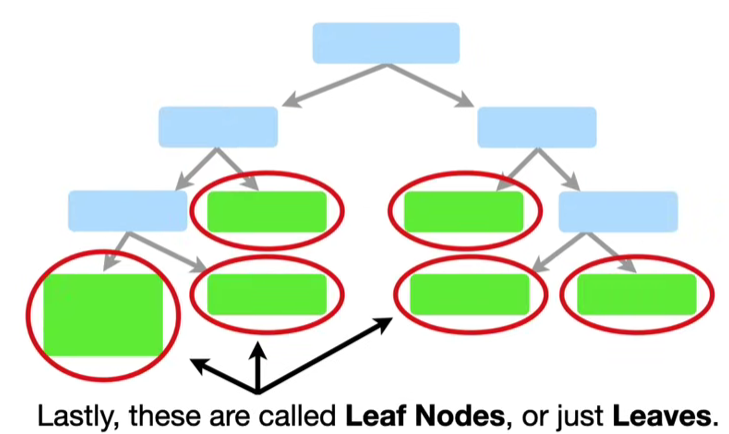
- Leaves/Leave nodes: the nodes that only have arrow pointing to them


#### How to build Classification Tree from raw data?**

![image-6.png](attachment:image-6.png)
- we will use this data to build Classification Tree that predicts whether or not someone loves cool as ice

1. First thing we do is decide is whether **Loves Popcorn**, **Loves Soda** or **Age** should be the question we asl at the very top of the tree.
    - To make that decision, we will start by looking at how well **Love Popcorn** predicts whether or not someone **Loves Cool as Ice**

![image-7.png](attachment:image-7.png)

    - To do this, we will make a super simple tree that only asks if someone **Loves Popcorn**, and them we run the data down the tree.
    - For example, the first person in the dataset **Loves Popcorn**, so they go to the **leaf** on the left, and they do not **Loves Cool As Ice**, we will keep track of that by putting a `1` under the word `No`
    - The second person in the dataset also **Lovees Popcorn**, so they go to the **Leaf** on the left, and becasue they also do not **Loves Cool As Ice**, we increment `No` to `2`.
    - The third person do not **Loves Popcorn**, so they go the the **Leaf** on the right, and because they **Love Cool AS Ice**, we put a `1` under the word `Yes`.
    - Likewise, we eun the remaining rows down the tree, keeping track of wheter or not each one **Loves Cool As Ice**
    - ![image-8.png](attachment:image-8.png)


- Now we do the exact same thing for **Loves Soda**
    - ![image-9.png](attachment:image-9.png)
- Looking at the two Little trees, we see that neither one does a perfect job predicting who will and who will not **Love Cool As Ice**

![image-10.png](attachment:image-10.png)
- Specifically, these three **Leaves** contain mixtures of people that do and do not **Love Cool As Ice**

*Terminology*

![image-11.png](attachment:image-11.png)
- **Impure**: Leaves that contain mixture of people who do and do not Love Cool As Ice

To conclude: 
- Because both **leaves** in the **Love Popcorn** tree are **impure**, and only one **Leaf** in the **Love Soda** tree is **Impure**, it seems like **Love Soda** does a better job predicting who will and will not **Love Cool as Ice**

#### How to Quantify Impurities of the leaves

**Gini Impurity**
- one of the way to quantify the impurity of the leaves
- To calculate the Gini Impurity for Loves Popcorn, we start by calculating the **Gini Impurity** for the individual **Leaves**

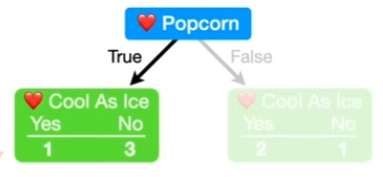
- The Gini Impurity for the leaf on the left is...
$$
\begin{align*}
Gini\ Impurity\ for\ a\ leaf 
&= 1 - (the\ probability\ of\ "Yes")^2 - (the\ probability\ of\ "No")^2 \\
&= 1 - (\frac{1}{1+3})^2 - (\frac{3}{1+3})^2 \\
&= 0.375
\end{align*}
$$

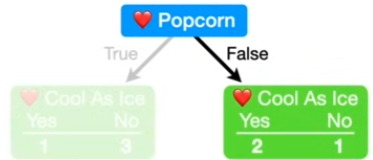
- The Gini Impurity for the leaf on the right is...
$$
\begin{align*}
Gini\ Impurity\ for\ a\ leaf 
&= 1 - (the\ probability\ of\ "Yes")^2 - (the\ probability\ of\ "No")^2 \\
&= 1 - (\frac{2}{2+1})^2 - (\frac{1}{2+1})^2 \\
&= 0.444
\end{align*}
$$

- Now, because the **Leaf** on the left has 4 people in it and the **leaf** on the right only has 3 people in it, the **leave** do not represent the same number of people.
- Thus,the weight for the left **Leaf** is the total number of people in the **Leaf**,4 divided by the total number of people in both **Leaves**,7
- the weight for the right **Leaf** is the total number of people in the **Leaf**,3 divided by the total number of people in both **Leaves**,7

$$
\begin{align*}
Total\ Gini \ impurity = weighted\ average\ of\ Gini\ Impurities\ for\ the\ leaves \\
&= \frac{4}{4+3} (0.375) + \frac{3}{4+3} (0.444) \\
&= 0.405
\end{align*}
$$

- So the Gini Impurity for Loves Popcorn is 0.405

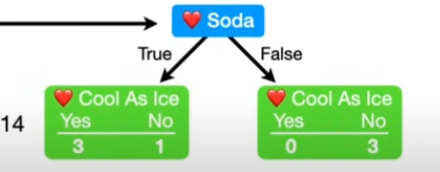
- Likewise, the Gini Impurity for Loves Soda is 0.214

*Now we need to calculate the Gini Impurity for Age*
- **Age** contains numeric data, and not just **Yes/No** values, calculating the **Gini Impurity** is a little more involved

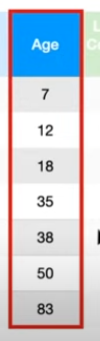
- The first thign we do is sort the rows by **Age**, from lowest value to highest value

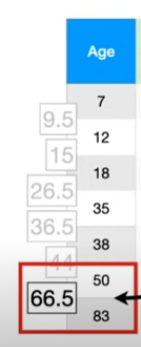
- Then we calculate the average **Age** for all adjacent people.

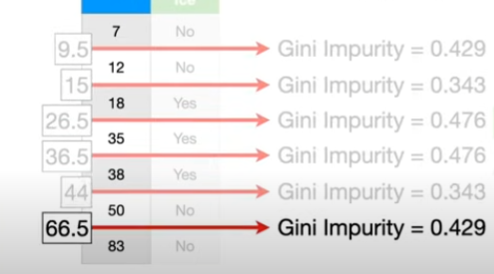
- Lastly, we calculate the Gini Impurity values for each average age

&nbsp;

For example, to calculate the **Gini Impurity** for the first value

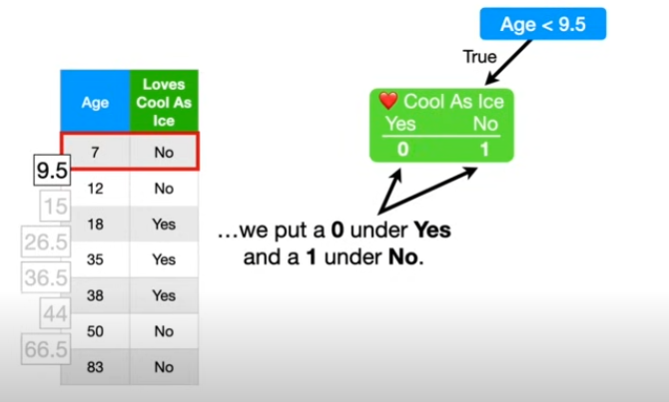
- We put **Age < 9.5** in the Root, and because the only person with **Age < 9.5** does not **Love Cool As Ice**, we put a 0 under **Yes** and a 1 under **No**

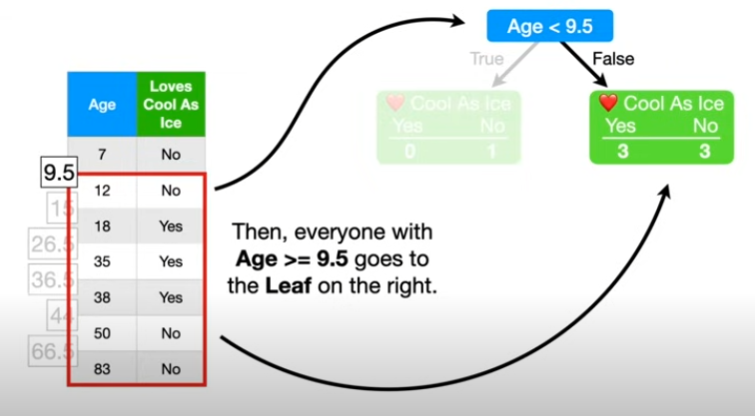
- Then everyone with **Age >= 9.5** goes to the **Leaf** on the right.
- And now we calculate the Gini Impurity for the **Leaf** on the left
$$
\begin{align*}
Impurity
&= 1 - (the\ probability\ of\ "Yes")^2 - (the\ probability\ of\ "No")^2 \\
&= 1 - (\frac{0}{0+1})^2 - (\frac{1}{0+1})^2 \\
&= 0
\end{align*}
$$
- and get 0, this make sense beacuse every single person in this **Leaf** does not **Love Cool As Ice**, so there is no **impurity**
- Then we calculate the Gini Impurity for the **Leaf** on the right..
$$
\begin{align*}
Impurity
&= 1 - (the\ probability\ of\ "Yes")^2 - (the\ probability\ of\ "No")^2 \\
&= 1 - (\frac{3}{3+3})^2 - (\frac{3}{3+3})^2 \\
&= 0.5
\end{align*}
$$
- and get 0.5
- Now we calculate the **Weighted Average** of the two **Impurities** to get the **Total Gini Impurity**...
$$
\begin{align*}
Total\ Gini \ impurity &= 
&= \frac{1}{1+6} (0) + \frac{6}{1+6} (0.5) \\
&= 0.429
\end{align*}
$$
- and get 0.429

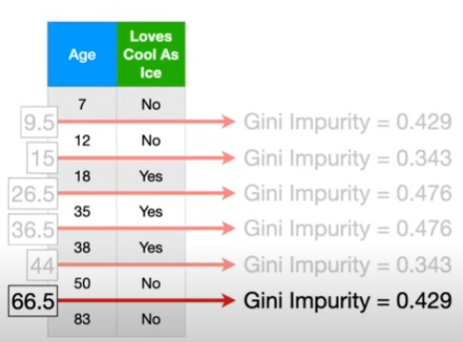
- Likewise, we calculate the **Gini Impurities for all the other candidate values

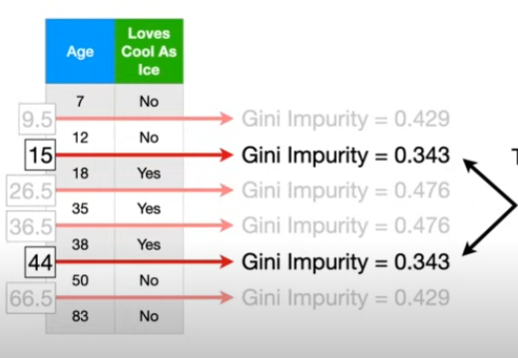
- These two candidate thresholds, 15 and 44 are tied for the lowest **Impurity**, 0.343...

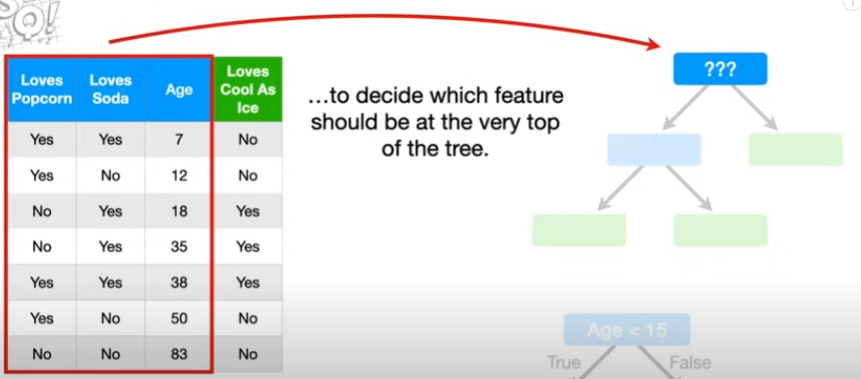
- However, remember that we are comparing Gini Impurity values for Age, Loves Popcorn and Loves Soda to decide which feature should be at the very top of the tree.
- Earlier we calculated the Gini Impurity values for Loves Popcorn, Loves Soda and now we have the Gini Impurity for Age

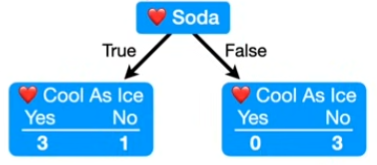
- And because **Loves Soda** has the lowest **Gini Impurity** overall, we know that its leaves have the lowest Impurity, so we put **Love Soda** at the top of the tree.
- Now the 4 people that **Love Soda** go to a Node on the left, and the people that do not **Love Soda** go to a Node on the right

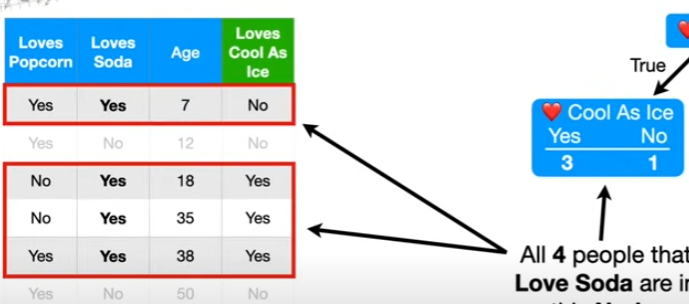
- Now lets focus on the Node on the left, all 4 people that **Love Soda** are in this **Node**, Three of these people love cool as ice and 1 does not.
- So this **Node** is **Impure**

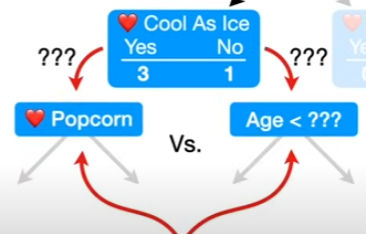

So let's see if we can reduce the Impurity by splitting the people that **Love Soda** based on **Loves Popcorn** or **Age**

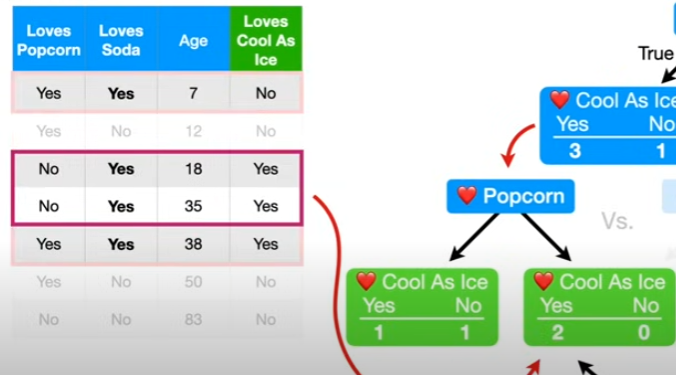
- We will start by asking the 4 people that love soda if they also love popcorn
- because 2 of the 4 people that love soda also love popcorn, they end up in the leaf on the left, the remaining 2 people that love soda, but do not love popcorn end up on the right. 
- And the total **Gini Impurity** for this split is **0.25**

Now we test different Age thresholds, just like before only this time, we only consider the **Ages** of people who **Love Soda**

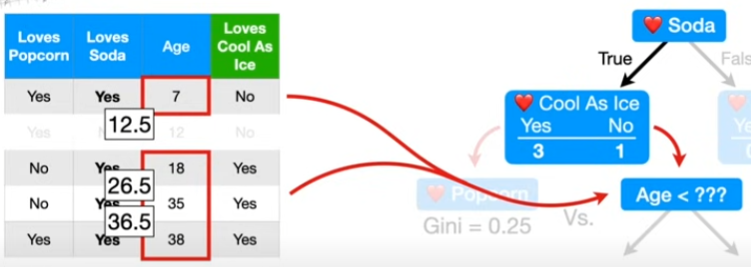

-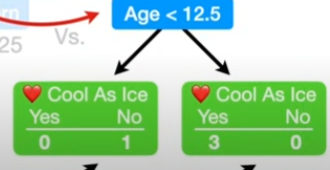
- **Age<12.5** gives us the lowest **Impurity**,0 because btoh leaves has no impurity at all

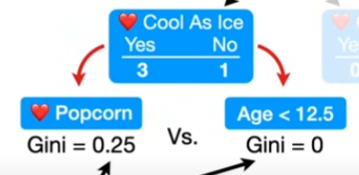
- Now, because 0 is less than 0.25, we will use **Age < 12.5** to split this Node into Leaves

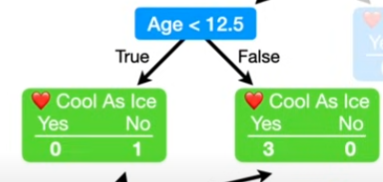
- Notes: these are leaves because there is no reason to continue splitting these people into smaller groups

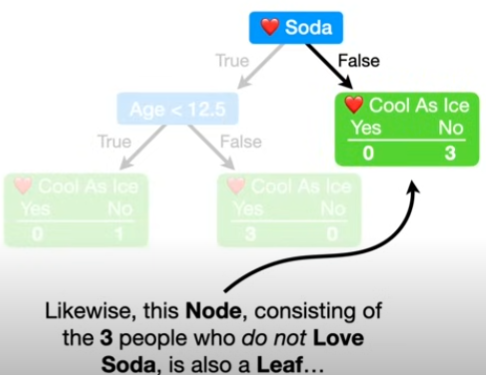
- Likewise, this Node, consisting of 3 people who do not **Love Soda**, is also a **leaf** because there is no reason to continue splitting these people into smaller groups

*We need to assign output values for each leaf*
- Generally speaking, the output of a leaf is whatever category that has the most votes.

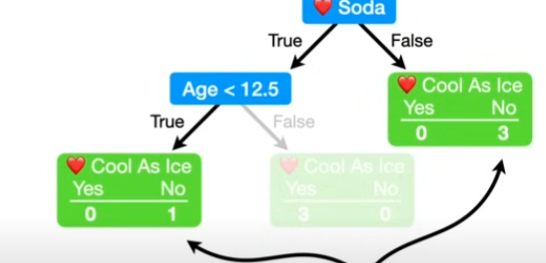
- In other words, because the majority of the people in these **Leaves** do not **Love Cool As Ice**

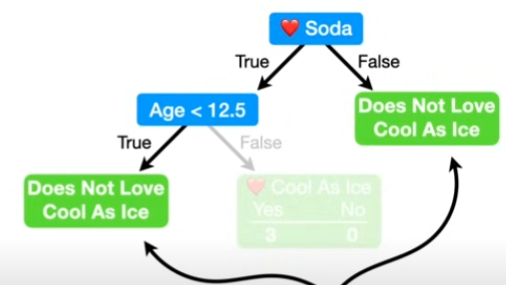
- the output values are **Does Not Love Cool As Ice**

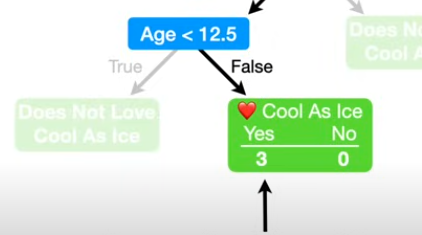
- and majority of the people in this **Leaf Love Cool as Ice**, the output value is **Love Cool As Ice**

Final output: 

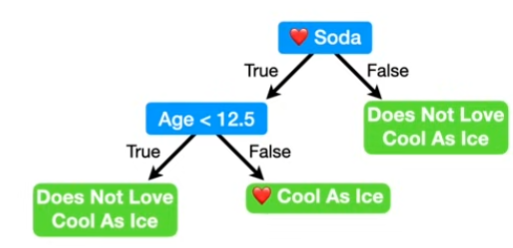

Notes: 

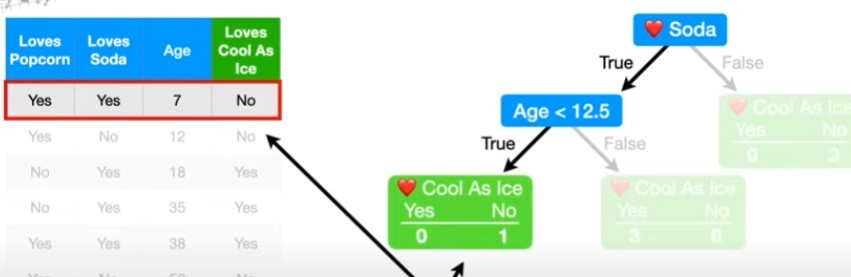
- Remember, when we built this tree, only one person in the original dataset made it to this **Leaf**
- Becasue so few people made it to this Leaf, it's hard to have confidence that it will do a great job making predictions with future data.
- And it is possible that we have **Overfit** the data (How to deal with this? **Pruning**)

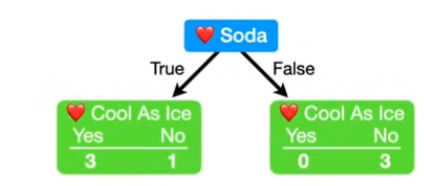
- Alternatively, we can put limits on how trees grow, for example, by requiring 3 or more people per leaf, now we end up with an impure leaf but also a better sense of accuracy of our prediction, because we know that only 75% of people in the **Leaf Loved Cool As Ice**

Note: Even when the Leaf is impure, we still need an output value to make a classification...

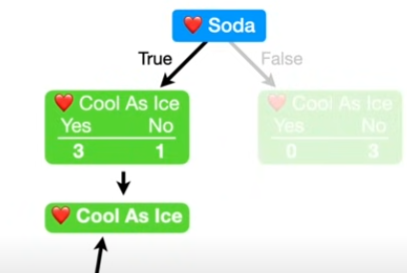
- since most of the people in this leaf **Love Cool As Ice**, that will be the output value

Note: When we build a tree, we dont know in advance if it is better to require 3 people per leaf or some other number, so we test different values with something called **Cross Validation** and pick the one that works best.

### Classification Trees (Part 2)

#### Feature Selection and Missing Data

**Feature Selection**
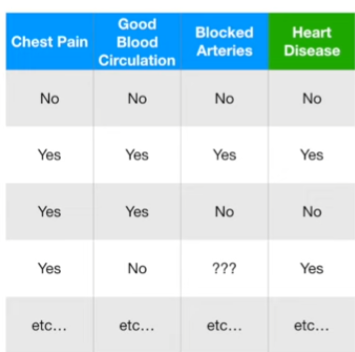

In the first StatQuest on Decision Trees, we started with a table of data, and built a decision tree that gave us a sense of how likely a patient might have heart disease if they have other symptoms.

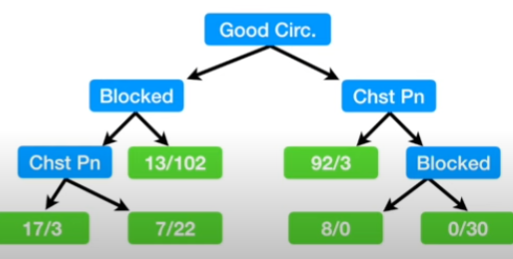
- We first ask if a patient had good blood circulation
- if so, we then asked if they had blocked arteries
- if so, we then asked if they had chest pain
- if so, there's a good chance that they have heart disease, since 17 people with similar answer did and only 3 people with similar answer did not.
- if they dont have chest pain, there's a good chance that they do not have heart disease

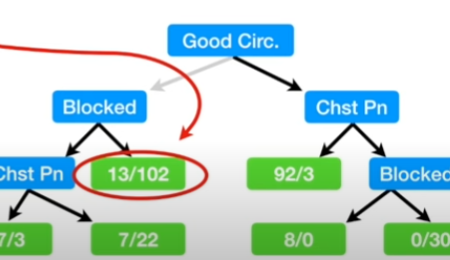
- However, remember that if someone had good circulation and did not have blocked arteries, we did not ask about chest pain because there was less impurity in our results if we didn't

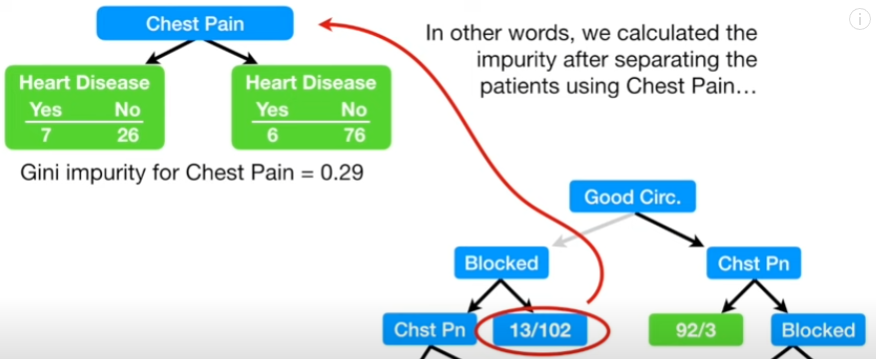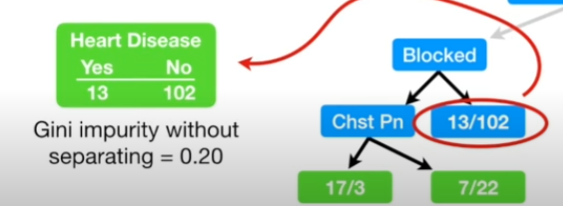
- in other words, we calculated the impurity after separating the patients using Chest Pain, then we calculated the impurity without separating
- and since the impurity was lower when we didnt separate, we made it a leaf node

*Now imagine if Chest Pain never gave us reduction in impurity score*

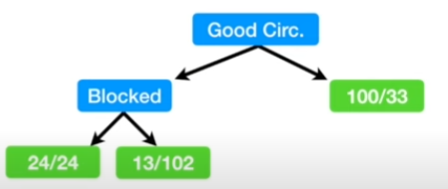
- If this were the case, we would never use Chest Pain to separate the patients, and Chest Pain would not be part of out tree.
- This is a type of automatic feature selection 
- However, we could have also created a threshold such that the imputiry reduction has to be large enough to make a big difference.
- As a result, we end up with simpler trees that are not **Overfit**

*Overfit*: means our tree does will with the original data, but doesn't do well with any other dataset
- Decision Trees have the downside of often being over fit
- REquiring each split to make a large reduction in impurity helps a tree from being over fit.

**Missing Data**

To deal with missing data in decision tree, we not necessary have to skip it,
we can impute it with 
- mode

Alternatively, we can find another column that has the highest correlation with blocked arteries and use that as a guide.

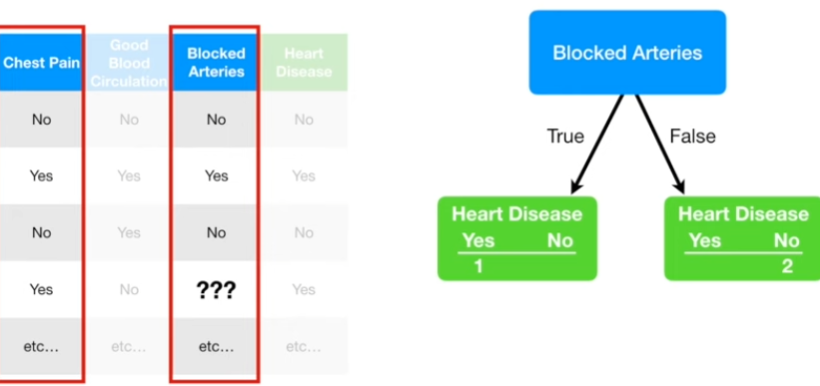
- In this case, Chest Pain and Blocked Arteries are often very similar.
- the first three patients are same in output for Chest Pain and Blocked Arteries
- So we can just imputet the missing "Blocked Arteries" with "Chess Pain" output

For numeric data like weight data, we can replace the missing value with the
- mean
- median

Alternatively, we could find another column that has the highest correlation with  weight 

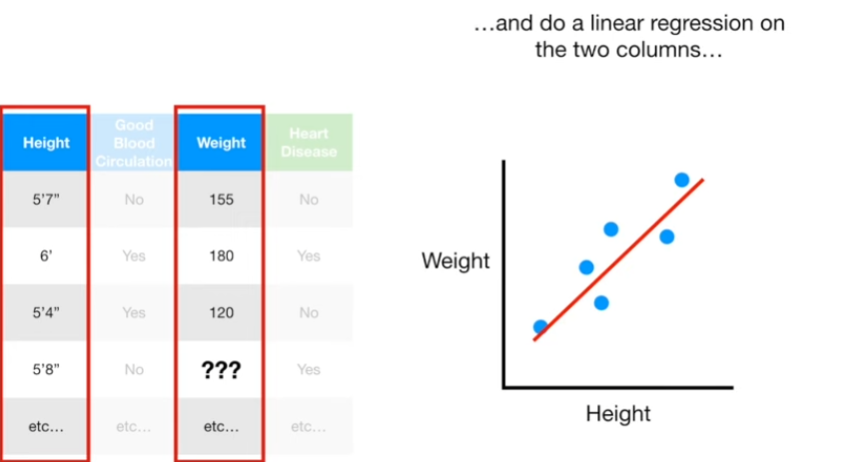
- in this case, height is highly correlated with weight 
- we can do a linear regression with the two columns and use the least squares line to predict the value for weight


### Regression Tree

Context: 

Imagine er developed a new drug to cure the common cold, however, we dont know the optimal dosage to give to patients, So we do a clinical trial with different dosages, and measure how effective each dosage is.

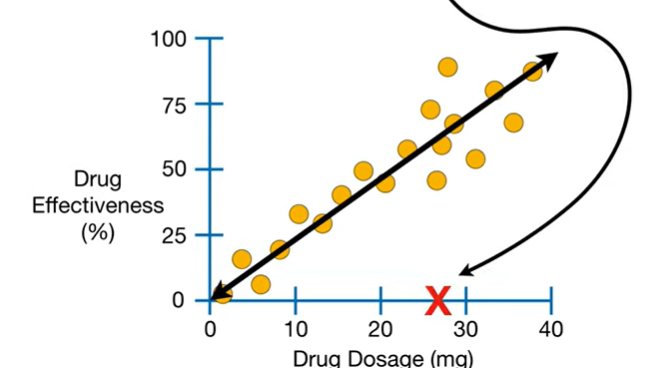
- if the data looked like this and in general, the higher the dose the more effective the drugs, then we can easily fit a line to the data 
- and if someone told us they were taking a 27mg Dose, we could use a line to predict that a 27mg Dose should be 62% effective

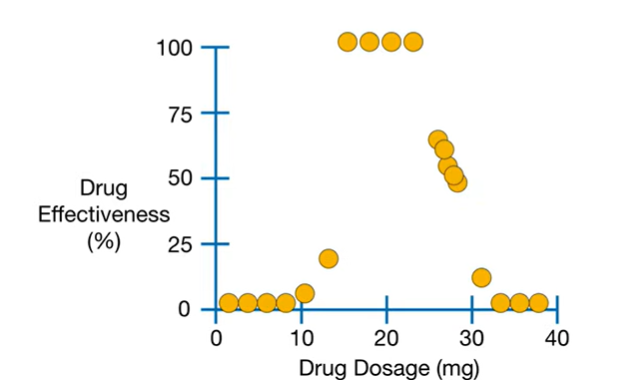
- if the data look like this, low dosages are not effective, moderate dosages work really well, somewhat higher dosages work at about 50% effectiveness and high dosages are not effective at all.
- in this case, fitting a line will not be very useful, so we need to use something other than a straight line to make predictions.
- One option is to use a Regression Tree


#### Regression Trees

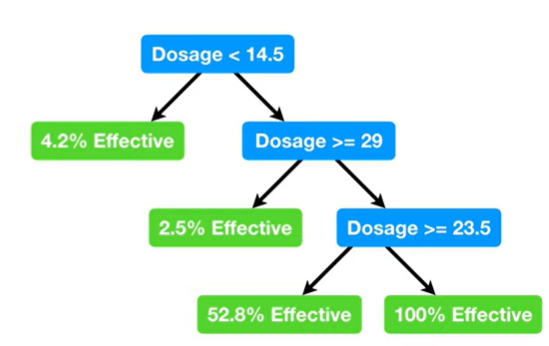

**Regression Trees** are a type of **Decision Tree**
- each leaf represents a numeric value, in contrast, **classification trees** have True or False in their leaves or some other discrete category

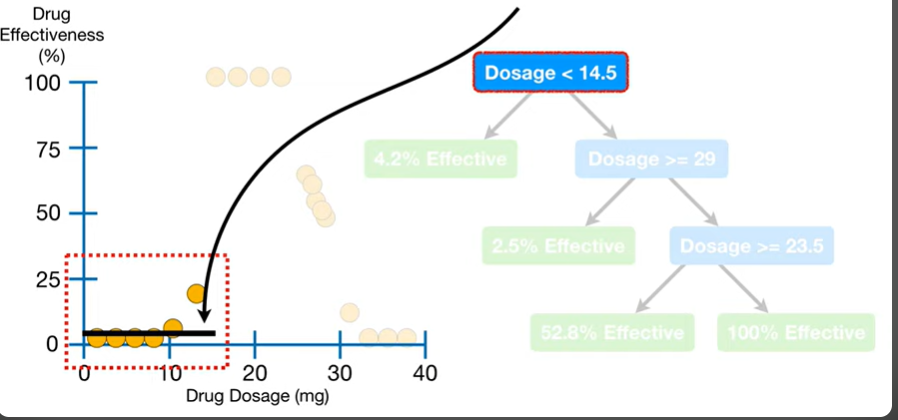
- With this regression tree, we start by asking if the Dosage is less than 14.5, if so, we are talking about thes 6 observations in the training data and the average drug effectiveness for these 6 observations is **4.2%** so the ress uses the average value, **4.2%**, as its prediction for people with **Dosages < 14.5**

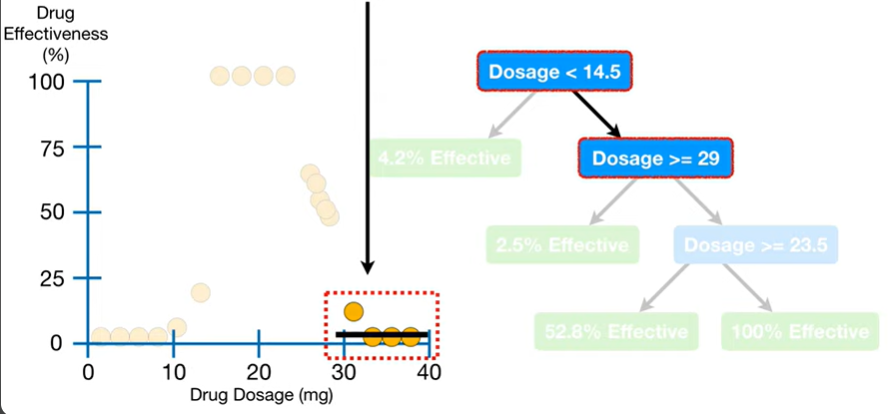
- on the other hand, if the **Dosage >= 14.5** and **>= 29**, then we are talking about these 4 observations in the dataset, and their average values are **2.5%**. So the tree uses tha average value, 2.5%, as its prediction for people with **Dosages >= 29**


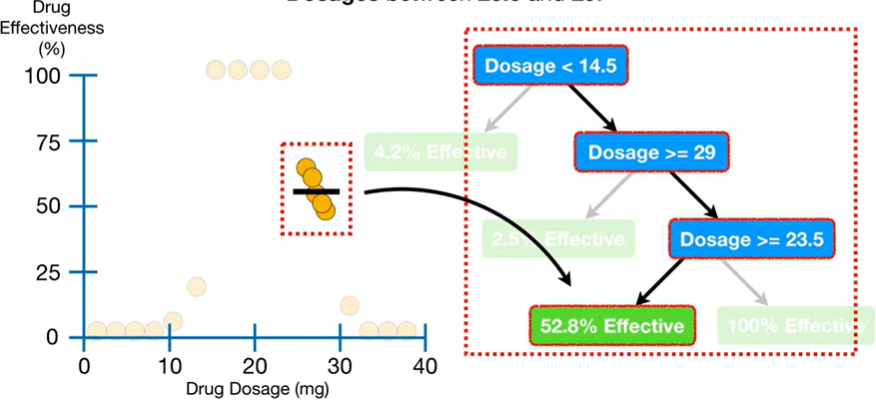
- Now, if the **Dosage >= 14.5** ,**< 29** and  **>=23.5**, then we are talking about these 5 observations in the dataset, and their average values are **52.8%**. So the tree uses tha average value, **52.8%**, as its prediction for people with **Dosages** between **23.5** and **29**

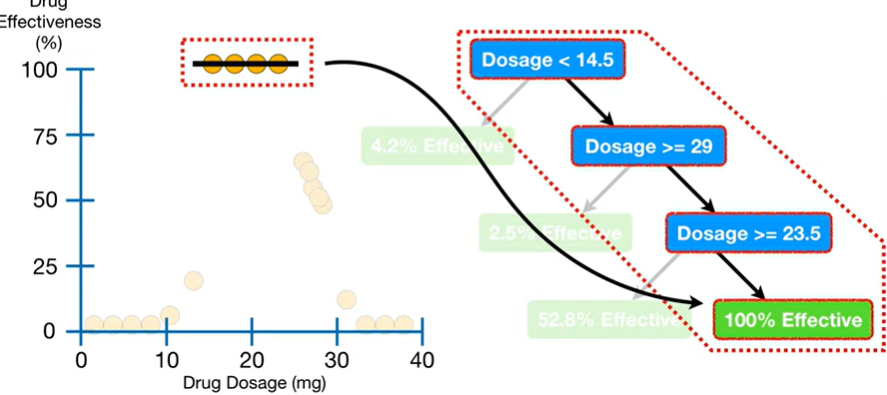
- lastly, if the **Dosage >= 14.5** ,**< 29** and  **< 23.5**, then we are talking about these 4 observations in the dataset, and their average values are **100%**. So the tree uses tha average value, **100%**, as its prediction for people with **Dosages** between **14.5** and **23.5**

Since each leaf corresponds to the average Drug Effectiveness in a different cluster of observations, the tree does a better job reflecting the data than the straight line

#### why dont just predict by eyes

- When the data are super simple and we are only using predictor, **Dosage** to predict **Drug effectiveness**, making predictions by eyes isn's terrible
- but when we have 3 or more predictors like Dosage, Age and Sex, to predict Drug Effectiveness, drawing a graph is very difficult, if not impossible

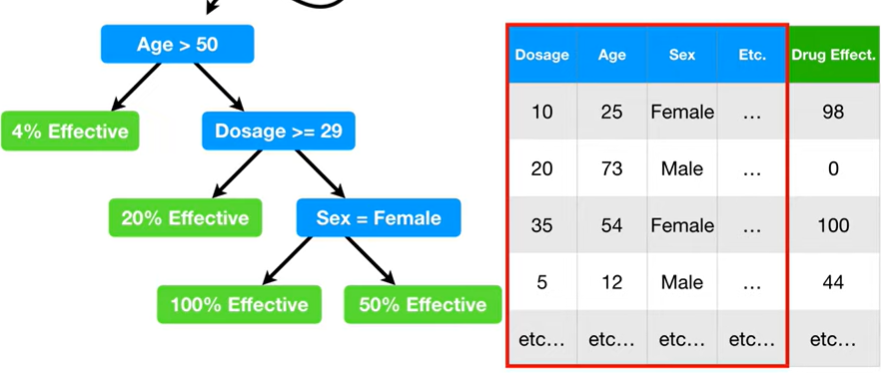
- in contrast, the regression tree easily accommodates the additional predictors.
- For example, if we wanted to predict the Drug Effectiveness for the first patient, we will start by asking **if they are older than 50**, and since they are not over 50, we follow the branch on the right and ask if their **Dosage >= 29** and since their dosage is not >= 29, we follow the branch on the right and ask **if they are female** and since they are **Female**, we follow the branch on the left and predict that the sodage will be **100% Effective** and that is not too far off from the truth, 98%

**Let's go back to the one predictor data and talk about  how to build this Regression Tree from scratch**